## Imports

In [1]:
import os
import glob
import re
from pathlib import Path
SCRIPTS_PATH = Path('/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction/Scripts')
os.chdir(SCRIPTS_PATH)
import datetime
import math
from functools import partial
import warnings
import random
import fnmatch
import pickle
from copy import deepcopy
from tqdm import tqdm
import json

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
%matplotlib inline
import seaborn as sns
import xarray as xr
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import spearmanr, pearsonr, beta, gaussian_kde
import dask
import iris
import iris.plot as iplt
import cftime
import cf_units
import cartopy
import cartopy.crs as ccrs
import geopandas as gpd
from shapely.geometry import shape
from rasterio.features import shapes
from rasterio.transform import from_bounds
from scipy.ndimage import convolve
import torchvision.transforms as transforms
import pytorch_lightning as pl
from pytorch_lightning import loggers as pl_loggers
from pytorch_lightning.callbacks import EarlyStopping, LearningRateMonitor
import optuna
import xgboost as xgb
#import libpysal as ps
#from esda.moran import Moran_Local
#%load_ext tensorboard
from distributed import Client

from functions import *
from global_variables import *
from pl_classes import *

INVERSE_FUNCS = {divide_by_100: lambda x: x.multiply(100),
                    log_transform: log_inverse,
                    log_transform_scaled: log_inverse_scaled
                         }

## Load model and define logs path

In [2]:
run_name = 'mse_1_64_log_None_ReLU_5_grasses_new_ordering' #'default' #'imbalanced' #'2024-10-02_154002' #False
if not run_name:
    logs_path = max([el for el in glob.glob(os.path.join(model_path, 'Logs', '*')) if not el.endswith('lightning_logs')] , key=os.path.getctime)
    study_name = os.path.basename(logs_path)
else:
    logs_path = os.path.join(model_path, 'Logs', run_name)
folds = [dirname[5:].split('_') for dirname in os.listdir(logs_path) if (os.path.isdir(os.path.join(logs_path, dirname)) and dirname != 'lightning_logs')]

### Tensorboard

In [4]:
%tensorboard --logdir {logs_path}

In [ ]:
from tensorboard import notebook
notebook.display(port=6006, height=500)

In [16]:
!kill 3801961

## Evaluation

### Load DataArrays

In [3]:
predicted_da = xr.open_dataset(os.path.join(logs_path, 'predicted_full.nc'), chunks={})['percentage_of_area_burned'].mean(dim='version').load()
predicted_da = np.maximum(predicted_da, 0)

gfed_regions = xr.open_dataset("/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction/Supplementary_Data/base_regions_upscaled.nc").__xarray_dataarray_variable__
gfed_regions = xr.DataArray(np.vectorize(gfed_idx_name.get)(gfed_regions), coords=gfed_regions.coords, dims=gfed_regions.dims)
gfed_regions = xr.where(gfed_regions == 'OCEAN', np.nan, gfed_regions)

predicted_da = constrain_time(predicted_da, 1901, 2019) #1997
predicted_cube = predicted_da.to_iris()
for coord in ('latitude', 'longitude'):
    predicted_cube.coords(coord)[0].guess_bounds()
    predicted_cube.coords(coord)[0].units = 'degrees'
    predicted_cube.coords(coord)[0].coord_system = cs
time_unit = cf_units.Unit('days since 1901-01-01T00:00:00', calendar='standard')

time_coord = predicted_cube.coords('time')[0]
time_coord.long_name = None
time_coord.standard_name = 'time'
time_coord.units = time_coord.units.change_calendar('standard')
date_values = time_coord.units.num2date(time_coord.points)
new_time_values = time_unit.date2num(date_values)
new_time_coord = iris.coords.DimCoord(new_time_values,
                                      standard_name='time',
                                      var_name='time',
                                      units=time_coord.units)
predicted_cube.replace_coord(new_time_coord)
predicted_cube.coords('time')[0].units = time_unit
predicted_cube.var_name = predicted_cube.long_name
predicted_cube.long_name = 'BuRNN'
predicted_cube.units = '%'

predicted_da_mha = xr.DataArray.from_iris(to_mha(predicted_cube))
if 'version' in predicted_da_mha.dims:
    predicted_df = predicted_da_mha.groupby(predicted_da_mha.Region).sum().to_dataframe(name='Burned Area').unstack('Region').rename(columns=AR6_idx_name).unstack('version').droplevel(None, axis=1)
else:
    predicted_df = predicted_da_mha.groupby(predicted_da_mha.Region).sum().to_pandas().rename(columns=AR6_idx_name)
predicted_df_yearly = predicted_df.resample('YS').sum()

predicted_cube_gfed = deepcopy(predicted_cube)
predicted_cube_gfed.coords('Region')[0].points = gfed_regions.values
predicted_da_mha_gfed = xr.DataArray.from_iris(to_mha(predicted_cube_gfed))
if 'version' in predicted_da_mha_gfed.dims:
    predicted_df_gfed = predicted_da_mha_gfed.groupby(predicted_da_mha_gfed.Region).sum().to_dataframe(name='Burned Area').unstack('Region').rename(columns=gfed_idx_name).unstack('version').droplevel(None, axis=1)
else:
    predicted_df_gfed = predicted_da_mha_gfed.groupby(predicted_da_mha_gfed.Region).sum().to_pandas().rename(columns=gfed_idx_name)
predicted_df_yearly_gfed = predicted_df_gfed.resample('YS').sum()

del predicted_cube_gfed, predicted_da_mha_gfed
predicted_cube = constrain_time(predicted_cube, 1997, 2019)

In [4]:
obs_da = xr.open_dataset(os.path.join(supplementary_data_path, 'GFED5_Burned_Percentage.nc')).percentage_of_area_burned
obs_da = obs_da.where(obs_da<101, np.nan)
obs_da = constrain_time(obs_da, start_year=1997, end_year=2019)
obs_da = obs_da.assign_coords({'Region': predicted_da.Region})
obs_cube = obs_da.to_iris()
obs_cube.rename('burntarea-total')
obs_cube.coords('latitude')[0].guess_bounds()
obs_cube.coords('latitude')[0].units = 'degrees'
obs_cube.coords('latitude')[0].coord_system = cs
obs_cube.coords('longitude')[0].guess_bounds()
obs_cube.coords('longitude')[0].units = 'degrees'
obs_cube.coords('longitude')[0].coord_system = cs
obs_cube.var_name = obs_cube.long_name
obs_cube.long_name = 'GFED5'

regions_masked = AR6_masks[1].copy()
regions_masked.data = np.ones_like(regions_masked.data)
for mask in AR6_masks.values():
    regions_masked *= mask

obs_cube = iris.util.mask_cube(obs_cube, regions_masked, in_place=False, dim=0)

obs_da_mha = xr.DataArray.from_iris(to_mha(obs_cube))
obs_df = obs_da_mha.groupby(predicted_da_mha.Region).sum().to_pandas()
obs_df = obs_df.rename(columns=AR6_idx_name)
obs_df_yearly = obs_df.resample('YS').sum()

obs_cube_gfed = deepcopy(obs_cube)
obs_cube_gfed.coords('Region')[0].points = gfed_regions.values
obs_da_mha_gfed = xr.DataArray.from_iris(to_mha(obs_cube_gfed))
obs_df_gfed = obs_da_mha_gfed.groupby(obs_da_mha_gfed.Region).sum().to_pandas()
obs_df_gfed = obs_df_gfed.rename(columns=gfed_idx_name)
obs_df_yearly_gfed = obs_df_gfed.resample('YS').sum()

In [5]:
start_date = 1997

model_filepaths = [os.path.join(root, filename) for root, _, filenames in os.walk(isimip_fire_path) for filename in filenames if fnmatch.fnmatch(filename, "*_gswp3-w5e5_obsclim_histsoc_default_burntarea-total_global_monthly_1901_2019.nc")]
model_ds = xr.open_mfdataset(model_filepaths, engine='netcdf4', preprocess=preprocess_model)
month_lengths = np.tile(np.array([(np.arange(f'{2005}-{str(x).rjust(2, "0")}', f'{2005+x//12}-{str(x%12+1).rjust(2, "0")}', dtype='datetime64[D]')).size for x in range(1, 13)]), model_ds.time.size//12)
model_ds['orchidee-mict']*=month_lengths[:, None, None]
model_ds = constrain_time(model_ds, start_year=start_date, end_year=2019)
model_ds = model_ds.apply(lambda variable: variable.assign_coords({'Region': predicted_da.Region}))
model_cubelist = ds_to_cubelist(model_ds)

model_ds_mha = to_dataset(to_mha(model_cubelist))
model_df = model_ds_mha.apply(lambda variable: variable.groupby(variable.Region).sum()).to_dataframe()
model_df = model_df.unstack('Region').rename(columns=AR6_idx_name).swaplevel(axis=1)
model_df.columns.names = ['Region', 'Model']
model_df = model_df.reindex(columns=pd.MultiIndex.from_tuples(sorted(model_df.columns, key=lambda x: (list(obs_df.columns).index(x[0]), x[1]))))
model_df_yearly = model_df.resample('YS').sum()
model_df_yearly.columns.names = ['Region', 'Model'] 

model_ds_mha['Region'] = gfed_regions
model_df_gfed = model_ds_mha.apply(lambda variable: variable.groupby(variable.Region).sum()).to_dataframe()
model_df_gfed = model_df_gfed.unstack('Region').rename(columns=gfed_idx_name).swaplevel(axis=1)
model_df_gfed.columns.names = ['Region', 'Model']
model_df_gfed = model_df_gfed.reindex(columns=pd.MultiIndex.from_tuples(sorted(model_df_gfed.columns, key=lambda x: (list(obs_df_gfed.columns).index(x[0]), x[1]))))
model_df_yearly_gfed = model_df_gfed.resample('YS').sum()
model_df_yearly_gfed.columns.names = ['Region', 'Model'] 

### Basic Evaluation

#### Static Evaluation

In [17]:
start_year, end_year = 1997, 2019
filename = os.path.join(supplementary_output_path, f'static_results_{start_year}_{end_year}.json')
if os.path.isfile(filename):
    with open(filename, 'r') as f:
        metrics = json.load(f)
else:
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    with open(filename, 'w') as f:
        rmse = {}
        spatial_rmse = {}
        corr = {}
        spatial_corr = {}
        monthly_corr = {}
        yearly_corr = {}
        for model in model_cubelist:
            model = constrain_time(model, start_year, end_year)
            obs_cube_constrained = constrain_time(obs_cube, start_year, end_year)
            modelname = f'{model.long_name}'
            
            rmse[modelname] = RMSE(model, obs_cube_constrained)
            
            pipeline = lambda cube: xr.DataArray.from_iris(cube)
            corr[modelname] = xr.corr(pipeline(model), pipeline(obs_cube_constrained)).values.item()
    
            pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
            spatial_rmse[modelname] = RMSE(pipeline(model), pipeline(obs_cube_constrained))
            spatial_corr[modelname] = xr.corr(pipeline(model), pipeline(obs_cube_constrained)).values.item()
    
            pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
            monthly_corr[modelname] = xr.corr(pipeline(model), pipeline(obs_cube_constrained)).values.item()
    
            pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
            yearly_corr[modelname] = xr.corr(pipeline(model), pipeline(obs_cube_constrained)).values.item()
    
        metrics = {'rmse': rmse, 'spatial_rmse': spatial_rmse, 'corr': corr, 'spatial_corr': spatial_corr, 'monthly_corr': monthly_corr, 'yearly_corr': yearly_corr}
        json.dump(metrics , f) 
    warnings.simplefilter(action="default", category=iris.warnings.IrisVagueMetadataWarning)

In [9]:
with open(os.path.join(supplementary_output_path, f'static_results_{start_year}_{end_year}.json'), 'r') as f:
    static_results = json.load(f)

filename = os.path.join(supplementary_output_path, 'static_results_regional.csv')
if os.path.isfile(filename):
    static_results_gfed = pd.read_csv(filename, header=[0, 1], index_col=0)
else:
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    start_year, end_year = 1997, 2019
    obs_cube_constrained = constrain_time(obs_cube, start_year, end_year)
    static_results_gfed = pd.DataFrame(index=static_results.keys(), columns=model_df_gfed.columns)
    for idx, region_cube in gfed_masks.items(): 
        regionname = region_cube.name()
        print(regionname)
        obs_cube_constrained_region = mask_region(obs_cube_constrained, region_cube)
        for model_cube in model_cubelist:
            modelname = f'{model_cube.long_name}'
            model_cube = constrain_time(model_cube, start_year, end_year)
            model_cube = mask_region(model_cube, region_cube)
            
            static_results_gfed.loc['rmse', (regionname, modelname)] = RMSE(model_cube, obs_cube_constrained_region)
            
            pipeline = lambda cube: xr.DataArray.from_iris(cube)
            static_results_gfed.loc['corr', (regionname, modelname)] = xr.corr(pipeline(model_cube), pipeline(obs_cube_constrained_region)).values.item()
    
            pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
            static_results_gfed.loc['spatial_rmse', (regionname, modelname)] = RMSE(pipeline(model_cube), pipeline(obs_cube_constrained_region))
            static_results_gfed.loc['spatial_corr', (regionname, modelname)] = xr.corr(pipeline(model_cube), pipeline(obs_cube_constrained_region)).values.item()
    
            pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
            static_results_gfed.loc['monthly_corr', (regionname, modelname)] = xr.corr(pipeline(model_cube), pipeline(obs_cube_constrained_region)).values.item()
    
            pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
            static_results_gfed.loc['yearly_corr', (regionname, modelname)] = xr.corr(pipeline(model_cube), pipeline(obs_cube_constrained_region)).values.item()        
    warnings.simplefilter(action="default", category=iris.warnings.IrisVagueMetadataWarning)
    static_results_gfed.to_csv(filename)

In [18]:
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
start_year, end_year = 1997, 2019
obs_cube_constrained = constrain_time(obs_cube, start_year, end_year)
predicted_constrained = constrain_time(predicted_cube, start_year, end_year)

static_results_gfed = pd.read_csv(os.path.join(supplementary_output_path, 'static_results_regional.csv'), header=[0, 1], index_col=0)

filename = os.path.join(logs_path, 'results_regional.csv')
if os.path.isfile(filename):
    results_gfed = pd.read_csv(os.path.join(logs_path, 'results_regional.csv'), index_col=0)
else:
    results_gfed = pd.DataFrame(index=static_results_gfed.keys(), columns=[cube.name() for cube in gfed_masks.values()])
    for idx, region_cube in gfed_masks.items(): 
        regionname = region_cube.name()
        print(regionname)
        obs_cube_constrained_region = mask_region(obs_cube_constrained, region_cube)
        predicted_constrained_region = mask_region(predicted_constrained, region_cube)
            
        results_gfed.loc['rmse', regionname] = RMSE(predicted_constrained_region, obs_cube_constrained_region)
        
        pipeline = lambda cube: xr.DataArray.from_iris(cube)
        results_gfed.loc['corr', regionname] = xr.corr(pipeline(predicted_constrained_region), pipeline(obs_cube_constrained_region)).values.item()
    
        pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
        results_gfed.loc['spatial_rmse', regionname] = RMSE(pipeline(predicted_constrained_region), pipeline(obs_cube_constrained_region))
        results_gfed.loc['spatial_corr', regionname] = xr.corr(pipeline(predicted_constrained_region), pipeline(obs_cube_constrained_region)).values.item()
    
        pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
        results_gfed.loc['monthly_corr', regionname] = xr.corr(pipeline(predicted_constrained_region), pipeline(obs_cube_constrained_region)).values.item()
    
        pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
        results_gfed.loc['yearly_corr', regionname] = xr.corr(pipeline(predicted_constrained_region), pipeline(obs_cube_constrained_region)).values.item()        
    warnings.simplefilter(action="default", category=iris.warnings.IrisVagueMetadataWarning)
    results_gfed.to_csv(filename)

BONA
TENA
CEAM
NHSA
SHSA
EURO
MIDE
NHAF
SHAF
BOAS
CEAS
SEAS
EQAS
AUST


#### Static Evaluation (Firecci)

In [8]:
firecci_5_1_da = xr.open_dataset(os.path.join(supplementary_data_path, 'FireCCI5.1_Burned_Percentage.nc')).percentage_of_area_burned
firecci_5_1_da = preprocess_time(firecci_5_1_da)
firecci_5_1_da = firecci_5_1_da.where(firecci_5_1_da<101, np.nan)
firecci_5_1_da = constrain_time(firecci_5_1_da, start_year=1997, end_year=2019)
firecci_5_1_da = firecci_5_1_da.assign_coords({'Region': predicted_da.Region})
firecci_5_1_cube = firecci_5_1_da.to_iris()
firecci_5_1_cube.rename('burntarea-total')
firecci_5_1_cube.coords('latitude')[0].guess_bounds()
firecci_5_1_cube.coords('latitude')[0].units = 'degrees'
firecci_5_1_cube.coords('latitude')[0].coord_system = cs
firecci_5_1_cube.coords('longitude')[0].guess_bounds()
firecci_5_1_cube.coords('longitude')[0].units = 'degrees'
firecci_5_1_cube.coords('longitude')[0].coord_system = cs
firecci_5_1_cube.var_name = firecci_5_1_cube.long_name
firecci_5_1_cube.long_name = 'FireCCi5.1'

regions_masked = AR6_masks[1].copy()
regions_masked.data = np.ones_like(regions_masked.data)
for mask in AR6_masks.values():
    regions_masked *= mask

firecci_5_1_cube = iris.util.mask_cube(firecci_5_1_cube, regions_masked, in_place=False, dim=0)

firecci_5_1_da_mha = xr.DataArray.from_iris(to_mha(firecci_5_1_cube))
firecci_5_1_df = firecci_5_1_da_mha.groupby(predicted_da_mha.Region).sum().to_pandas()
firecci_5_1_df = firecci_5_1_df.rename(columns=AR6_idx_name)
firecci_5_1_df_yearly = firecci_5_1_df.resample('YS').sum()

firecci_5_1_cube_gfed = deepcopy(firecci_5_1_cube)
firecci_5_1_cube_gfed.coords('Region')[0].points = gfed_regions.values
firecci_5_1_da_mha_gfed = xr.DataArray.from_iris(to_mha(firecci_5_1_cube_gfed))
firecci_5_1_df_gfed = firecci_5_1_da_mha_gfed.groupby(firecci_5_1_da_mha_gfed.Region).sum().to_pandas()
firecci_5_1_df_gfed = firecci_5_1_df_gfed.rename(columns=gfed_idx_name)
firecci_5_1_df_yearly_gfed = firecci_5_1_df_gfed.resample('YS').sum()

In [20]:
start_year, end_year = 2001, 2019
filename = os.path.join(supplementary_output_path, f'static_results_{start_year}_{end_year}_firecci51.json')
if os.path.isfile(filename):
    with open(filename, 'r') as f:
        metrics = json.load(f)
else:
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    with open(filename, 'w') as f:
        rmse = {}
        spatial_rmse = {}
        corr = {}
        spatial_corr = {}
        monthly_corr = {}
        yearly_corr = {}
        for model in tqdm(model_cubelist):
            model = constrain_time(model, start_year, end_year)
            obs_cube_constrained = constrain_time(firecci_5_1_cube, start_year, end_year)
            modelname = f'{model.long_name}'
            
            rmse[modelname] = RMSE(model, obs_cube_constrained)
            
            pipeline = lambda cube: xr.DataArray.from_iris(cube)
            corr[modelname] = xr.corr(pipeline(model), pipeline(obs_cube_constrained)).values.item()
    
            pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
            spatial_rmse[modelname] = RMSE(pipeline(model), pipeline(obs_cube_constrained))
            spatial_corr[modelname] = xr.corr(pipeline(model), pipeline(obs_cube_constrained)).values.item()
    
            pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
            monthly_corr[modelname] = xr.corr(pipeline(model), pipeline(obs_cube_constrained)).values.item()
    
            pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
            yearly_corr[modelname] = xr.corr(pipeline(model), pipeline(obs_cube_constrained)).values.item()
    
        metrics = {'rmse': rmse, 'spatial_rmse': spatial_rmse, 'corr': corr, 'spatial_corr': spatial_corr, 'monthly_corr': monthly_corr, 'yearly_corr': yearly_corr}
        json.dump(metrics , f) 
    warnings.simplefilter(action="default", category=iris.warnings.IrisVagueMetadataWarning)

100%|██████████| 9/9 [01:14<00:00,  8.24s/it]


In [23]:
start_year, end_year = 2001, 2019
with open(os.path.join(supplementary_output_path, f'static_results_{start_year}_{end_year}_firecci51.json'), 'r') as f:
    static_results = json.load(f)

filename = os.path.join(supplementary_output_path, 'static_results_regional_firecci51.csv')
if os.path.isfile(filename):
    static_results_gfed = pd.read_csv(filename, header=[0, 1], index_col=0)
else:
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    obs_cube_constrained = constrain_time(firecci_5_1_cube, start_year, end_year)
    static_results_gfed = pd.DataFrame(index=static_results.keys(), columns=model_df_gfed.columns)
    for idx, region_cube in tqdm(gfed_masks.items()): 
        regionname = region_cube.name()
        obs_cube_constrained_region = mask_region(obs_cube_constrained, region_cube)
        for model_cube in model_cubelist:
            modelname = f'{model_cube.long_name}'
            model_cube = constrain_time(model_cube, start_year, end_year)
            model_cube = mask_region(model_cube, region_cube)
            
            static_results_gfed.loc['rmse', (regionname, modelname)] = RMSE(model_cube, obs_cube_constrained_region)
            
            pipeline = lambda cube: xr.DataArray.from_iris(cube)
            static_results_gfed.loc['corr', (regionname, modelname)] = xr.corr(pipeline(model_cube), pipeline(obs_cube_constrained_region)).values.item()
    
            pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
            static_results_gfed.loc['spatial_rmse', (regionname, modelname)] = RMSE(pipeline(model_cube), pipeline(obs_cube_constrained_region))
            static_results_gfed.loc['spatial_corr', (regionname, modelname)] = xr.corr(pipeline(model_cube), pipeline(obs_cube_constrained_region)).values.item()
    
            pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
            static_results_gfed.loc['monthly_corr', (regionname, modelname)] = xr.corr(pipeline(model_cube), pipeline(obs_cube_constrained_region)).values.item()
    
            pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
            static_results_gfed.loc['yearly_corr', (regionname, modelname)] = xr.corr(pipeline(model_cube), pipeline(obs_cube_constrained_region)).values.item()        
    warnings.simplefilter(action="default", category=iris.warnings.IrisVagueMetadataWarning)
    static_results_gfed.to_csv(filename)

100%|██████████| 14/14 [17:27<00:00, 74.83s/it]


In [39]:
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
start_year, end_year = 2001, 2019
obs_cube_constrained = constrain_time(firecci_5_1_cube, start_year, end_year)
predicted_constrained = constrain_time(predicted_cube, start_year, end_year)

static_results_gfed = pd.read_csv(os.path.join(supplementary_output_path, 'static_results_regional_firecci51.csv'), header=[0, 1], index_col=0)

filename = os.path.join(logs_path, 'results_regional_firecci51.csv')
if os.path.isfile(filename):
    results_gfed = pd.read_csv(filename, index_col=0)
else:
    results_gfed = pd.DataFrame(index=static_results_gfed.index, columns=[cube.name() for cube in gfed_masks.values()])
    for idx, region_cube in tqdm(gfed_masks.items()): 
        regionname = region_cube.name()
        obs_cube_constrained_region = mask_region(obs_cube_constrained, region_cube)
        predicted_constrained_region = mask_region(predicted_constrained, region_cube)
            
        results_gfed.loc['rmse', regionname] = RMSE(predicted_constrained_region, obs_cube_constrained_region)
        
        pipeline = lambda cube: xr.DataArray.from_iris(cube)
        results_gfed.loc['corr', regionname] = xr.corr(pipeline(predicted_constrained_region), pipeline(obs_cube_constrained_region)).values.item()
    
        pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
        results_gfed.loc['spatial_rmse', regionname] = RMSE(pipeline(predicted_constrained_region), pipeline(obs_cube_constrained_region))
        results_gfed.loc['spatial_corr', regionname] = xr.corr(pipeline(predicted_constrained_region), pipeline(obs_cube_constrained_region)).values.item()
    
        pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
        results_gfed.loc['monthly_corr', regionname] = xr.corr(pipeline(predicted_constrained_region), pipeline(obs_cube_constrained_region)).values.item()
    
        pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
        results_gfed.loc['yearly_corr', regionname] = xr.corr(pipeline(predicted_constrained_region), pipeline(obs_cube_constrained_region)).values.item()        
    warnings.simplefilter(action="default", category=iris.warnings.IrisVagueMetadataWarning)
    results_gfed.to_csv(filename)

100%|██████████| 14/14 [01:15<00:00,  5.40s/it]


#### Current Run

In [8]:
start_year, end_year = 1997, 2019
with open(os.path.join(supplementary_output_path, f'static_results_{start_year}_{end_year}.json'), 'r') as f:
    static_results = json.load(f)
results_df = pd.DataFrame()
for metric, metric_dict in static_results.items():
    for model, value in metric_dict.items():
        results_df.loc[metric.replace('_', ''), model] = value
with open(os.path.join(logs_path, f'results_{start_year}_{end_year}.tex'), 'w') as f:
    obs_cube_constrained = constrain_time(obs_cube, start_year, end_year)
    predicted_cube_constrained = constrain_time(predicted_cube, start_year, end_year)
    print(f'{run_name}: {start_year} - {end_year}')
    print('RMSE (in %)')
    result = round(RMSE(predicted_cube_constrained, obs_cube_constrained), 2)
    metric_name = 'rmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    

    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(cube)
    print('Spatio-Temporal Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'corr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)

    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'spatialcorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
    print('Temporal Correlation (monthly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'monthlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
    print('Temporal Correlation (yearly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'yearlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    from numpy.linalg import lstsq
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisUserWarning)
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    def calculate_trend(cube):
        y = to_annual(to_global(to_mha(cube))).data
        x = np.arange(len(y))
        res = stats.linregress(x, y)
        # Two-sided inverse Students t-distribution
        # p - probability, df - degrees of freedom
        tinv = lambda p, df: abs(stats.t.ppf(p/2, df))
        ts = tinv(0.05, len(x)-2)
        return f"{res.slope:.2f} ± {ts*res.stderr:.2f}"
        #print(f"slope (95%): {res.slope:.6f} +/- {ts*res.stderr:.6f}")
        #print(f"intercept (95%): {res.intercept:.6f}" f" +/- {ts*res.intercept_stderr:.6f}")
    print('Trend (in Mha per year)')
    print('GFED5', calculate_trend(obs_cube))
    print('BuRNN', calculate_trend(predicted_cube))


    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial RMSE (in %)')
    result = round(RMSE(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)), 2)
    metric_name = 'spatialrmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
results_df = results_df.reindex(columns=['LSTM'] + list(results_df.columns[:-1])).rename({'LSTM': '\gls{model}'}, axis=1)
results_df = results_df.rename({
    'rmse': '\gls{rmse}',
    'spatialrmse': 'Spatial \gls{rmse}',
    'corr': 'Correlation',
    'spatialcorr': 'Spatial Correlation',
    'monthlycorr': 'Monthly Correlation', 
    'yearlycorr': 'Yearly Correlation'
})

mse_1_64_log_None_ReLU_5_grasses_new_ordering: 1997 - 2019
RMSE (in %)
BuRNN 1.67
Spatio-Temporal Correlation
BuRNN 0.7
Spatial Correlation
BuRNN 0.89
Temporal Correlation (monthly)
BuRNN 0.81
Temporal Correlation (yearly)
BuRNN 0.72
Trend (in Mha per year)
GFED5 -7.14 ± 2.91
BuRNN -1.08 ± 1.02
Spatial RMSE (in %)
BuRNN 0.5


## Paper Figures

### Main Figures

#### Mean Burned Area (spatial maps)

classic
elm-eca
jules-inferno-vn6p3
lpj-guess-simfire-blaze
lpj-guess-spitfire
lpjml5-7-10-fire
orchidee-mict
ssib4-triffid-fire
visit


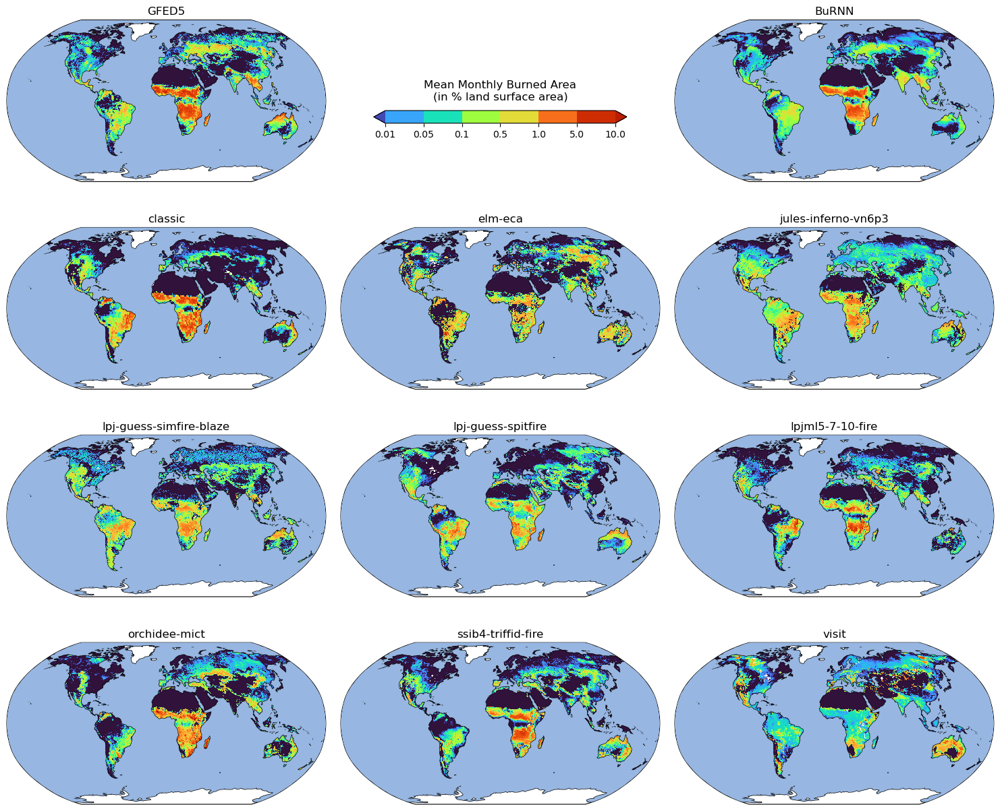

In [90]:
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
start_year, end_year = 2003, 2019
modelnames = list(model_ds.keys())
number_of_plots = 1 + 1 + len(modelnames) + 1
fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(15, 12), subplot_kw={'projection': ccrs.Robinson()})
axs = axs.ravel()
cmap = plt.get_cmap('turbo').copy()
# Get the darkest color in turbo
darkest_turbo_color = cmap(0.0)  # 0.0 = bottom of the colormap
# Set it as the 'under' color
cmap.set_under(darkest_turbo_color)
boundaries = [0.01, 0.05, 0.1, 0.5, 1, 5, 10]  # Discrete steps
# for some reason the cmap doesn't like it when you use lognorm norm and when vmin is below 1.
# So we multiply our results by a large factor, and divide our cbar so it shows the original values.
cmap_corr_f = 1000

boundaries = np.array(boundaries)*cmap_corr_f

for idx in range(number_of_plots):
    ax = axs[idx]
    if idx == 0:
        cube = constrain_time(obs_cube, start_year, end_year)
        title = 'GFED5'
    elif idx == 1:
        ax.set_frame_on(False)
            # Use fig.colorbar() with the first 10 subplots for proper alignment
        cbar = fig.colorbar(mesh, ax=ax, orientation='horizontal', label='Mean Monthly Burned Area\n(in % land surface area)', boundaries=boundaries, ticks=boundaries, extend='both')
        cbar.ax.set_xticklabels(boundaries/cmap_corr_f)
        continue
    elif idx == 2:
        cube = constrain_time(predicted_cube, start_year, end_year)
        cube = iris.util.mask_cube(cube, pixel_mean(obs_cube).data.mask)
        title = 'BuRNN'
    else:
        modelname = model_cubelist[idx-3].name()
        print(modelname)
        cube = constrain_time(model_cubelist[idx-3], start_year, end_year)
        cube = iris.util.mask_cube(cube, pixel_mean(obs_cube).data.mask)
        title = modelname

    data = (pixel_mean(cube)+0.0001)*cmap_corr_f#/cube.collapsed(('time', 'latitude', 'longitude'), iris.analysis.MEAN)
    norm = mcolors.LogNorm(vmin=0.005*cmap_corr_f, vmax=20*cmap_corr_f)
    mesh = iplt.pcolormesh(data, axes=ax, norm=norm, cmap=cmap) #afmhot_r

    ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
    ax.add_feature(cartopy.feature.OCEAN, zorder=10)
    ax.set_title(title)
plt.tight_layout()

cbar.ax.set_position([0.375, 0.85, 0.25, 0.02])
cbar.ax.xaxis.set_label_position('top')
cbar.ax.xaxis.labelpad = 12 # Space between cbar and label
cbar.ax.xaxis.label.set_size(12) # Label fontsize

plt.savefig(os.path.join(logs_path, 'global_mean.png'), dpi=300)
warnings.simplefilter(action="default", category=iris.warnings.IrisVagueMetadataWarning)

#### Error maps

classic
elm-eca
jules-inferno-vn6p3
lpj-guess-simfire-blaze
lpj-guess-spitfire
lpjml5-7-10-fire
orchidee-mict
ssib4-triffid-fire
visit


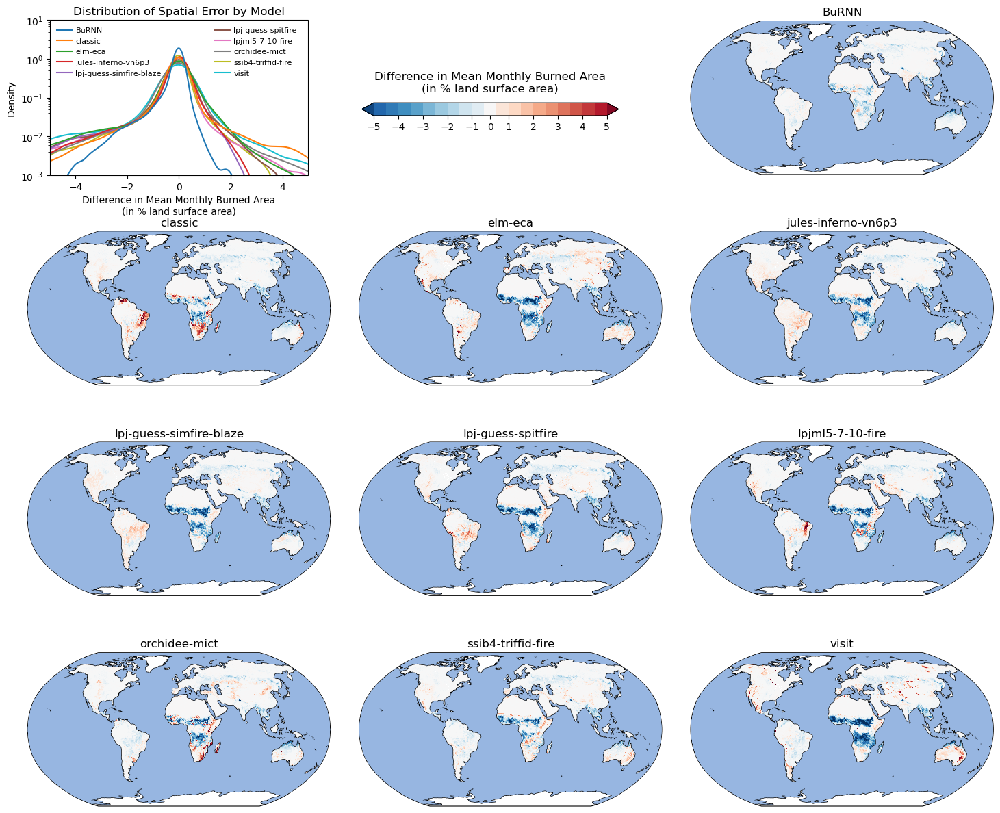

In [12]:
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
start_year, end_year = 1997, 2019
v_value = 5
step = 0.5
boundaries = list(np.arange(-v_value, v_value+step, step))
boundaries = boundaries[:int(v_value/step)] + boundaries[int(v_value/step)+1:]
obs_plot = constrain_time(obs_cube, start_year, end_year)
modelnames = list(model_ds.keys())
LSTM_name = 'BuRNN'
number_of_plots = 1 + 1 + len(modelnames) + 1
results = []
label='Difference in Mean Monthly Burned Area\n(in % land surface area)'

fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(15, 12), subplot_kw={'projection': ccrs.Robinson()})
axs = axs.ravel()
for idx in range(2, number_of_plots):
    ax = axs[idx]
    if idx == 2:
        cube = constrain_time(predicted_cube, start_year, end_year)
        cube = iris.util.mask_cube(cube, pixel_mean(obs_cube).data.mask)
        title = LSTM_name
    else:
        modelname = model_cubelist[idx-3].name()
        print(modelname)
        cube = constrain_time(model_cubelist[idx-3], start_year, end_year)
        cube = iris.util.mask_cube(cube, pixel_mean(obs_cube).data.mask)
        title = modelname

    data = pixel_mean(cube)-pixel_mean(obs_plot)#/cube.collapsed(('time', 'latitude', 'longitude'), iris.analysis.MEAN)
    mesh = iplt.pcolormesh(data, axes=ax, cmap='RdBu_r', vmin=-v_value-1, vmax=v_value+1) #afmhot_r
    ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
    ax.add_feature(cartopy.feature.OCEAN, zorder=10)
    ax.set_title(title)
    results.append(pd.DataFrame({'model': title, 'value': data.data.data[~data.data.mask]}))

#axs[0].set_frame_on(False)

df = pd.concat(results, ignore_index=True)
ax = axs[0]
ax = sns.kdeplot(data=df, x='value', hue='model', ax=ax, common_norm=False, fill=False, bw_adjust=3, clip=(-5, 5), log_scale=[False, True])
ax.set_xlim([-5, 5])
ax.set_ylim([1e-3, 3])
ax.set_title("Distribution of Spatial Error by Model")
ax.set_xlabel(label)
ax.set_ylabel("Density")
ax.set_xticks([-4., -2.,  0.,  2.,  4.])
ax.set_yticks([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01])
ax.set_aspect(1.5)
sns.move_legend(ax, loc='upper left', fontsize=8, frameon=False, title=None, ncols=2, columnspacing=7, handletextpad=0.5)

plt.tight_layout()
axs[1].set_frame_on(False)
cbar = fig.colorbar(mesh, ax=axs[1], orientation='horizontal', label=label, boundaries=boundaries, ticks=boundaries, extend='both')
cbar.ax.set_position([0.375, 0.85, 0.25, 0.02])
cbar.ax.xaxis.set_label_position('top')
cbar.ax.xaxis.labelpad = 12 # Space between cbar and label
cbar.ax.xaxis.label.set_size(12) # Label fontsize
cbar.locator = matplotlib.ticker.MaxNLocator(integer=True)
cbar.update_ticks()


plt.savefig(os.path.join(logs_path, 'global_diff.png'), dpi=300)
warnings.simplefilter(action="default", category=iris.warnings.IrisVagueMetadataWarning)

#### GFED Regional Timeseries

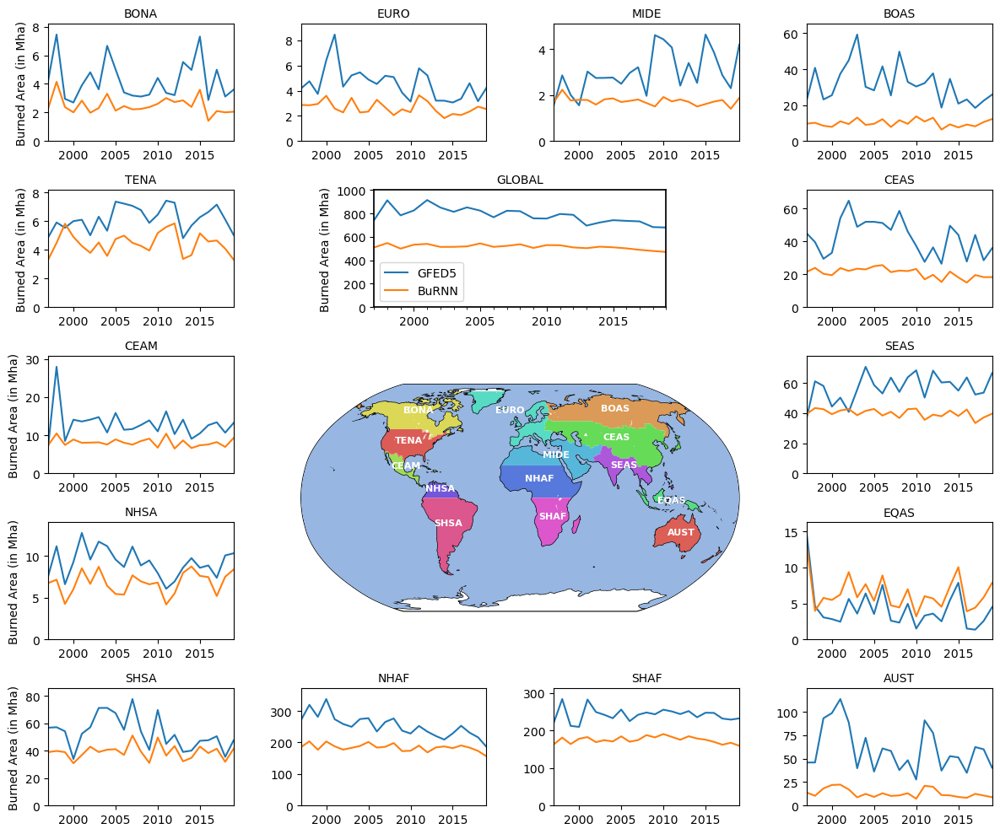

In [20]:
import matplotlib.gridspec as gridspec

start_year, end_year = 1997, 2019

modelname = 'BuRNN'

fig = plt.figure(figsize=(12, 10))
gs = gridspec.GridSpec(5, 4, figure=fig)

gfed_plot_order = ['BONA', 'EURO', 'MIDE', 'BOAS', 'TENA', 'CEAS', 'CEAM', 'SEAS', 'NHSA', 'EQAS', 'SHSA', 'NHAF', 'SHAF', 'AUST']

obs_df_plot = obs_df_yearly_gfed.loc[f'{start_year}-01-01':]
pred_df_plot = predicted_df_yearly_gfed.loc[f'{start_year}-01-01':]

outer_axes = []  # List to collect all outer axes
idx = 0
# Loop through grid cells
for i in range(5):
    for j in range(4):
        # Check if the cell is on the outer border
        if i in [0, 4] or j in [0, 3]:
            ax = fig.add_subplot(gs[i, j])
            regionname = gfed_plot_order[idx]
            obs_region, model_region = obs_df_plot.loc[slice(None), regionname], pred_df_plot.loc[slice(None), regionname]
            pd.concat([obs_region, model_region], axis=1, keys=['GFED5', modelname]).plot(ax=ax, legend=False)
            ax.set_title(regionname, fontsize=10) 
            ax.set_xlabel('')
            if not j:
                ax.set_ylabel('Burned Area (in Mha)')
            model_max, obs_max = model_region.max(), obs_region.max()
            if type(model_max) == pd.Series:
                model_max = model_max.max()
            max_val = max(model_max, obs_max)
            ax.set_ylim([0, max_val*1.1])
            outer_axes.append(ax)
            idx += 1
            ax.set_xticks(np.array([2000, 2005, 2010, 2015])-1970, [2000, 2005, 2010, 2015])

ax_global = fig.add_subplot(gs[1, 1:3])
corr_f = 1 / (pred_df_plot.columns.size / obs_df_plot.columns.size)
pd.concat([obs_df_plot.sum(axis=1), corr_f*pred_df_plot.sum(axis=1)], axis=1, keys=['GFED5', modelname]).plot(ax=ax_global, legend=True)
ax_global.set_title('GLOBAL', fontsize=10, weight=1.2) 
ax_global.set_ylim(0, max([1000, corr_f*pred_df_plot.sum(axis=1).max()]))
ax_global.set_xlabel('')
ax_global.set_ylabel('Burned Area (in Mha)')


#ax_global.set_position([global_pos.x0 + dis_change, global_pos.y0, global_pos.width-1.8*dis_change, global_pos.height], which='active')

# Combine the six middle cells into one central axis
ax_center = fig.add_subplot(gs[2:4, 1:3], projection=ccrs.Robinson())
ax_center.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax_center.add_feature(cartopy.feature.OCEAN, zorder=10)


gfed_keys = list(gfed_mask.keys())
gfed_combined = deepcopy(gfed_mask[gfed_keys[0]]).rename('GFED') * 0
for idx, regionname in enumerate(gfed_keys):
    gfed_combined.values += idx*(~gfed_mask[gfed_keys[idx]])
region_idcs = {idx: region for idx, region in enumerate(list(gfed_mask.keys()))}

geometries = []
labels = []
for geom, value in shapes(gfed_combined.values.astype(np.float32), transform=from_bounds(gfed_combined.lon.min(), gfed_combined.lat.min(), gfed_combined.lon.max(), gfed_combined.lat.max(), gfed_combined.lon.size, gfed_combined.lat.size)):
    geometries.append(shape(geom))  # Convert to Shapely geometry
    labels.append(int(value))       # Preserve the region label

# Create GeoDataFrame
gdf = gpd.GeoDataFrame({'region': [region_idcs[label] for label in labels], 'geometry': geometries}, crs="EPSG:4326")
gdf = gdf.dissolve(by='region').reset_index()
gdf = gdf.drop(10)

ax_center.set_extent([-180, 180, -90, 90])
ax_center = gdf.plot(ax=ax_center, transform=ccrs.PlateCarree(), legend=False, cmap=sns.color_palette('hls', 14, as_cmap=True))
gdf.apply(lambda x: ax_center.annotate(text=x.region, xy=x.geometry.centroid.coords[0], xycoords=ccrs.PlateCarree(), ha='center', fontsize=8, zorder=100, c='white', weight='bold'), axis=1)

for ax in outer_axes:
    ax.minorticks_off()

plt.tight_layout()

pos = ax_global.get_position()
new_width = pos.width / 1.5
new_x0 = pos.x0 + (pos.width - new_width) / 2
new_y0 = pos.y0
ax_global.set_position([new_x0, new_y0, new_width, pos.height])
for spine in ax_global.spines:
    ax_global.spines[spine].set_linewidth(1.25)
    
plt.savefig(os.path.join(logs_path, f'gfed_regions_{start_year}_{end_year}.png'), dpi=400)
plt.show()

#### Reconstruction (optionally including Mouillot)

In [6]:
import rioxarray
tiff_files = glob.glob("/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction/Supplementary_Data/Mouillot_Field_2005/*.tif")
ds = xr.concat([rioxarray.open_rasterio(f, chunks=True) for f in tiff_files], dim="time")
ds = ds.drop(['spatial_ref', 'band'])[:, 0]
# Set time coordinates if applicable (replace with actual timestamps)
ds["time"] = np.arange(np.datetime64('1899-01-01'), np.datetime64('2000-01-01'), dtype='datetime64[Y]')
ds = ds.interp(y=gfed_regions.lat, x=gfed_regions.lon)

gfed_regions = xr.open_dataset("/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction/Supplementary_Data/base_regions_upscaled.nc").__xarray_dataarray_variable__
gfed_regions = xr.DataArray(np.vectorize(gfed_idx_name.get)(gfed_regions), coords=gfed_regions.coords, dims=gfed_regions.dims)
gfed_regions = xr.where(gfed_regions == 'OCEAN', np.nan, gfed_regions)

mouillot_da = constrain_time(ds, 1901, 2019) * 100 #1997
mouillot_da['Region'] = gfed_regions
mouillot_da = mouillot_da.rename({'lat': 'latitude', 'lon': 'longitude'}).drop(['x', 'y'])
mouillot_cube = mouillot_da.to_iris()
mouillot_cube.coords('time')[0].standard_name = 'time'
for coord in ('latitude', 'longitude'):
    mouillot_cube.coords(coord)[0].guess_bounds()
    mouillot_cube.coords(coord)[0].units = 'degrees'
    mouillot_cube.coords(coord)[0].coord_system = cs
time_unit = cf_units.Unit('days since 1901-01-01T00:00:00', calendar='standard')
time_coord = mouillot_cube.coords('time')[0]
time_coord.long_name = None
time_coord.units = time_coord.units.change_calendar('standard')
date_values = time_coord.units.num2date(time_coord.points)
new_time_values = time_unit.date2num(date_values)
new_time_coord = iris.coords.DimCoord(new_time_values,
                                      standard_name='time',
                                      var_name='time',
                                      units=time_coord.units)
mouillot_cube.replace_coord(new_time_coord)
mouillot_cube.coords('time')[0].units = time_unit
mouillot_cube.var_name = mouillot_cube.long_name
mouillot_cube.long_name = 'Mouillot'
mouillot_cube.units = '%'

mouillot_cube.coords('Region')[0].points = gfed_regions.values
mouillot_da_mha_gfed = xr.DataArray.from_iris(to_mha(mouillot_cube))
mouillot_df_gfed = mouillot_da_mha_gfed.groupby(mouillot_da_mha_gfed.Region).sum().to_pandas().rename(columns=gfed_idx_name)
mouillot_df_yearly_gfed = mouillot_df_gfed.resample('YS').sum()

/tmp/ipykernel_1843095/170029296.py:6: UserWarning: Converting non-nanosecond precision datetime values to nanosecond precision. This behavior can eventually be relaxed in xarray, as it is an artifact from pandas which is now beginning to support non-nanosecond precision values. This warning is caused by passing non-nanosecond np.datetime64 or np.timedelta64 values to the DataArray or Variable constructor; it can be silenced by converting the values to nanosecond precision ahead of time.
  ds["time"] = np.arange(np.datetime64('1899-01-01'), np.datetime64('2000-01-01'), dtype='datetime64[Y]')


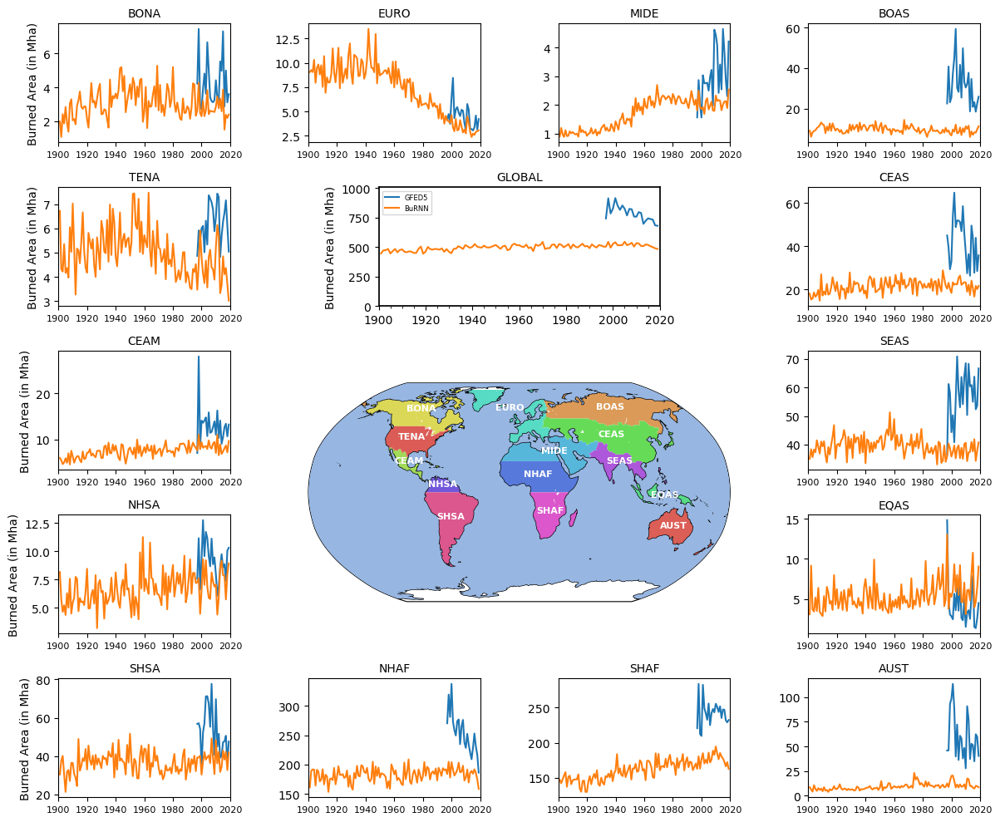

In [8]:
import matplotlib.gridspec as gridspec

mouillot = False
RA = False

start_year = 1997

if RA:
    label = 'Burned Area\n(Relative Anomaly)'
else:
    label = 'Burned Area (in Mha)'

modelname = 'BuRNN'

fig = plt.figure(figsize=(12, 10))
gs = gridspec.GridSpec(5, 4, figure=fig)

gfed_plot_order = ['BONA', 'EURO', 'MIDE', 'BOAS', 'TENA', 'CEAS', 'CEAM', 'SEAS', 'NHSA', 'EQAS', 'SHSA', 'NHAF', 'SHAF', 'AUST']

outer_axes = []  # List to collect all outer axes
idx = 0
# Loop through grid cells
for i in range(5):
    for j in range(4):
        # Check if the cell is on the outer border
        if i in [0, 4] or j in [0, 3]:
            ax = fig.add_subplot(gs[i, j])
            regionname = gfed_plot_order[idx]
            obs_region, pred_region, mouillot_region = obs_df_yearly_gfed.loc[slice(None), regionname], predicted_df_yearly_gfed.loc[slice(None), regionname], mouillot_df_yearly_gfed.loc[slice(None), regionname]
            if mouillot:
                data = pd.concat([obs_region, pred_region, mouillot_region], axis=1, keys=['GFED5', modelname, 'Mouillot & Field (2005)'])
            else:
                data = pd.concat([obs_region, pred_region], axis=1, keys=['GFED5', modelname])

            if RA:
                mean = data.loc[f'{start_year}-01-01':].mean()
                data = (data-mean)/mean

            data.plot(ax=ax, legend=False)

            ax.set_title(regionname, fontsize=10) 
            ax.set_xlabel('')
            if not j:
                ax.set_ylabel(label)
            #ax.set_xticks(np.arange(1910, 2020, 10)-1970)
            outer_axes.append(ax)
            idx += 1
            ax.set_xticks(np.arange(1900, 2021, 20)-1970, np.arange(1900, 2021, 20), fontsize=8)

ax_global = fig.add_subplot(gs[1, 1:3])
if mouillot:
    global_data = pd.concat([obs_df_yearly_gfed.sum(axis=1), predicted_df_yearly_gfed.sum(axis=1), mouillot_df_yearly_gfed.sum(axis=1)], axis=1, keys=['GFED5', modelname, 'Mouillot & Field (2005)'])
else:
    global_data = pd.concat([obs_df_yearly_gfed.sum(axis=1), predicted_df_yearly_gfed.sum(axis=1)], axis=1, keys=['GFED5', modelname])

if RA:
    global_mean = global_data.loc[f'{start_year}-01-01':].mean()
    global_data = (global_data-global_mean)/global_mean
    ymin, ymax = -1, 1.1*global_data.max().max()
else:
    ymin, ymax = 0, max([1000, 1.1*global_data.max().max()])
global_data.plot(ax=ax_global, legend=True) 
plt.legend(fontsize=6)

ax_global.set_title('GLOBAL', fontsize=10, weight=1.2) 
ax_global.set_ylim(ymin, ymax)
ax_global.set_xlabel('')
ax_global.set_ylabel(label)
ax_global.set_xticks(np.arange(1900, 2021, 20)-1970, np.arange(1900, 2021, 20))


#ax_global.set_position([global_pos.x0 + dis_change, global_pos.y0, global_pos.width-1.8*dis_change, global_pos.height], which='active')

# Combine the six middle cells into one central axis
ax_center = fig.add_subplot(gs[2:4, 1:3], projection=ccrs.Robinson())
ax_center.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax_center.add_feature(cartopy.feature.OCEAN, zorder=10)


gfed_keys = list(gfed_mask.keys())
gfed_combined = deepcopy(gfed_mask[gfed_keys[0]]).rename('GFED') * 0
for idx, regionname in enumerate(gfed_keys):
    gfed_combined.values += idx*(~gfed_mask[gfed_keys[idx]])
region_idcs = {idx: region for idx, region in enumerate(list(gfed_mask.keys()))}

geometries = []
labels = []
for geom, value in shapes(gfed_combined.values.astype(np.float32), transform=from_bounds(gfed_combined.lon.min(), gfed_combined.lat.min(), gfed_combined.lon.max(), gfed_combined.lat.max(), gfed_combined.lon.size, gfed_combined.lat.size)):
    geometries.append(shape(geom))  # Convert to Shapely geometry
    labels.append(int(value))       # Preserve the region label

# Create GeoDataFrame
gdf = gpd.GeoDataFrame({'region': [region_idcs[label] for label in labels], 'geometry': geometries}, crs="EPSG:4326")
gdf = gdf.dissolve(by='region').reset_index()
gdf = gdf.drop(10)

ax_center.set_extent([-180, 180, -90, 90])
ax_center = gdf.plot(ax=ax_center, transform=ccrs.PlateCarree(), legend=False, cmap=sns.color_palette('hls', 14, as_cmap=True))
gdf.apply(lambda x: ax_center.annotate(text=x.region, xy=x.geometry.centroid.coords[0], xycoords=ccrs.PlateCarree(), ha='center', fontsize=8, zorder=100, c='white', weight='bold'), axis=1)

for ax in outer_axes:
    ax.minorticks_off()

plt.tight_layout()

pos = ax_global.get_position()
new_width = pos.width / 1.5
new_x0 = pos.x0 + (pos.width - new_width) / 2
new_y0 = pos.y0
ax_global.set_position([new_x0, new_y0, new_width, pos.height])
for spine in ax_global.spines:
    ax_global.spines[spine].set_linewidth(1.25)

if mouillot:
    if RA:
        plt.savefig(os.path.join(logs_path, f'Reconstruction_1901_2019_mouillot_RA.png'), dpi=400)
    else:
        plt.savefig(os.path.join(logs_path, f'Reconstruction_1901_2019_mouillot.png'), dpi=400)
else:
    if RA:
        plt.savefig(os.path.join(logs_path, f'Reconstruction_1901_2019_RA.png'), dpi=400)
    else:
        plt.savefig(os.path.join(logs_path, f'Reconstruction_1901_2019.png'), dpi=400)
plt.show()

#### Reconstruction (FireCCiLT11)

In [192]:
firecci_11_da = xr.open_dataset(os.path.join(supplementary_data_path, 'FireCCILT11_Burned_Percentage.nc')).drop_dims('bnds').percentage_of_area_burned
firecci_11_da = preprocess_time(firecci_11_da)
firecci_11_da = firecci_11_da.where(firecci_11_da<101, np.nan)
firecci_11_da = firecci_11_da.assign_coords({'Region': predicted_da.Region})
firecci_11_cube = firecci_11_da.to_iris()
firecci_11_cube.rename('burntarea-total')
firecci_11_cube.coords('latitude')[0].guess_bounds()
firecci_11_cube.coords('latitude')[0].units = 'degrees'
firecci_11_cube.coords('latitude')[0].coord_system = cs
firecci_11_cube.coords('longitude')[0].guess_bounds()
firecci_11_cube.coords('longitude')[0].units = 'degrees'
firecci_11_cube.coords('longitude')[0].coord_system = cs
firecci_11_cube.var_name = firecci_11_cube.long_name
firecci_11_cube.long_name = 'FireCCI11'

regions_masked = AR6_masks[1].copy()
regions_masked.data = np.ones_like(regions_masked.data)
for mask in AR6_masks.values():
    regions_masked *= mask

firecci_11_cube = iris.util.mask_cube(firecci_11_cube, regions_masked, in_place=False, dim=0)

firecci_11_da_mha = xr.DataArray.from_iris(to_mha(firecci_11_cube))
firecci_11_df = firecci_11_da_mha.groupby(predicted_da_mha.Region).sum().to_pandas()
firecci_11_df = firecci_11_df.rename(columns=AR6_idx_name)
firecci_11_df_yearly = firecci_11_df.resample('YS').sum()

firecci_11_cube_gfed = deepcopy(firecci_11_cube)
firecci_11_cube_gfed.coords('Region')[0].points = gfed_regions.values
firecci_11_da_mha_gfed = xr.DataArray.from_iris(to_mha(firecci_11_cube_gfed))
firecci_11_df_gfed = firecci_11_da_mha_gfed.groupby(firecci_11_da_mha_gfed.Region).sum().to_pandas()
firecci_11_df_gfed = firecci_11_df_gfed.rename(columns=gfed_idx_name)
firecci_11_df_yearly_gfed = firecci_11_df_gfed.resample('YS').sum()

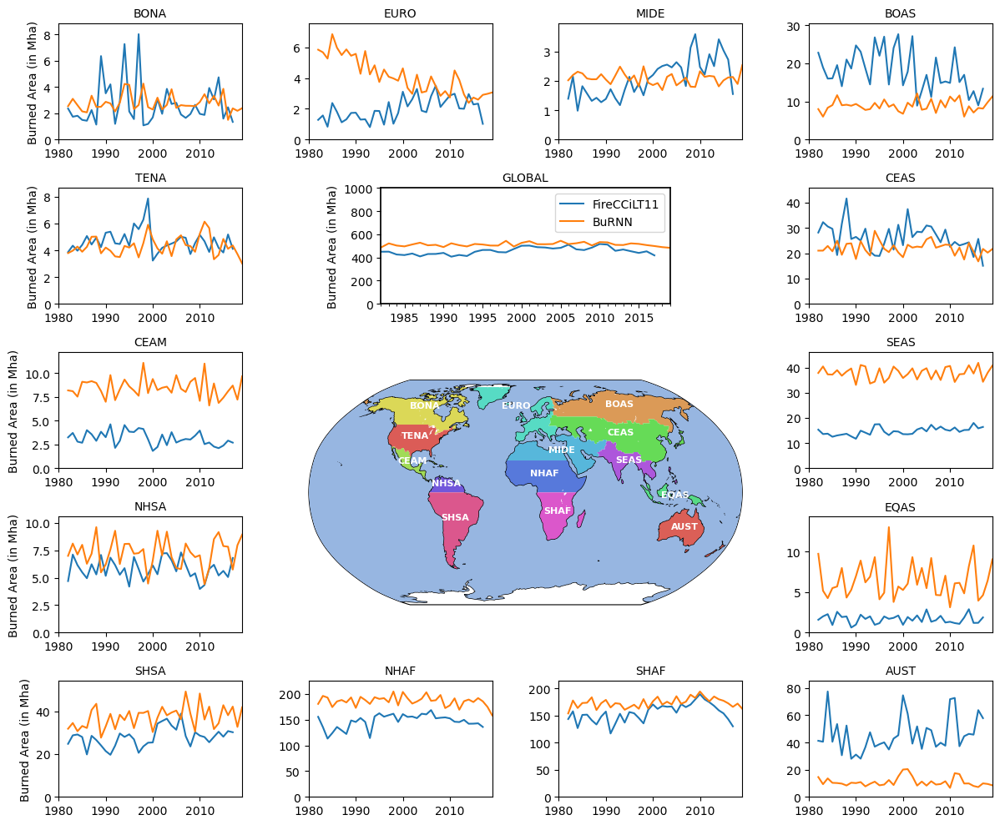

In [273]:
import matplotlib.gridspec as gridspec

start_year, end_year = 1982, 2019

modelname = 'BuRNN'

fig = plt.figure(figsize=(12, 10))
gs = gridspec.GridSpec(5, 4, figure=fig)

gfed_plot_order = ['BONA', 'EURO', 'MIDE', 'BOAS', 'TENA', 'CEAS', 'CEAM', 'SEAS', 'NHSA', 'EQAS', 'SHSA', 'NHAF', 'SHAF', 'AUST']

firecci_11_df_plot = firecci_11_df_yearly_gfed.loc[f'{start_year}-01-01':]
pred_df_plot = predicted_df_yearly_gfed.loc[f'{start_year}-01-01':]
gfed_df_plot = obs_df_yearly_gfed.loc[f'{start_year}-01-01':]

correlations = pd.DataFrame(index=['past', 'present'])
gfed_firecci_correlations = pd.DataFrame(index=['present'])

outer_axes = []  # List to collect all outer axes
idx = 0
# Loop through grid cells
for i in range(5):
    for j in range(4):
        # Check if the cell is on the outer border
        if i in [0, 4] or j in [0, 3]:
            ax = fig.add_subplot(gs[i, j])
            regionname = gfed_plot_order[idx]
            gfed_region = gfed_df_plot.loc[slice(None), regionname]
            firecci_11_region, model_region = firecci_11_df_plot.loc[slice(None), regionname], pred_df_plot.loc[slice(None), regionname]
            pd.concat([firecci_11_region, model_region], axis=1, keys=['FireCCiLT11', modelname]).plot(ax=ax, legend=False)
            ax.set_title(regionname, fontsize=10) 
            ax.set_xlabel('')
            if not j:
                ax.set_ylabel('Burned Area (in Mha)')
            model_max, firecci_11_max = model_region.max(), firecci_11_region.max()
            if type(model_max) == pd.Series:
                model_max = model_max.max()
            max_val = max(model_max, firecci_11_max)
            ax.set_ylim([0, max_val*1.1])
            outer_axes.append(ax)
            idx += 1
            ax.set_xticks(np.array([1980, 1990, 2000, 2010])-1970, [1980, 1990, 2000, 2010])

            corr_df = pd.DataFrame()
            corr_df['firecci'] = firecci_11_region['1982-01-01':'1994-01-01']
            corr_df['BuRNN'] = model_region['1982-01-01':'1994-01-01']
            correlations.loc['past', (regionname)] = corr_df.corr().iloc[0, 1]

            corr_df = pd.DataFrame()
            corr_df['firecci'] = firecci_11_region['1997-01-01':'2019-01-01']
            corr_df['BuRNN'] = model_region['1997-01-01':'2019-01-01']
            correlations.loc['present', (regionname)] = corr_df.corr().iloc[0, 1]

            corr_df = pd.DataFrame()
            corr_df['firecci'] = firecci_11_region['1997-01-01':'2019-01-01']
            corr_df['GFED5'] = gfed_region['1997-01-01':'2019-01-01']
            gfed_firecci_correlations.loc['present', (regionname)] = corr_df.corr().iloc[0, 1]

            
ax_global = fig.add_subplot(gs[1, 1:3])
corr_f = 1 / (pred_df_plot.columns.size / firecci_11_df_plot.columns.size)
pd.concat([firecci_11_df_plot.sum(axis=1), corr_f*pred_df_plot.sum(axis=1)], axis=1, keys=['FireCCiLT11', modelname]).plot(ax=ax_global, legend=True)
ax_global.set_title('GLOBAL', fontsize=10, weight=1.2) 
ax_global.set_ylim(0, max([1000, corr_f*pred_df_plot.sum(axis=1).max()]))
ax_global.set_xlabel('')
ax_global.set_ylabel('Burned Area (in Mha)')


#ax_global.set_position([global_pos.x0 + dis_change, global_pos.y0, global_pos.width-1.8*dis_change, global_pos.height], which='active')

# Combine the six middle cells into one central axis
ax_center = fig.add_subplot(gs[2:4, 1:3], projection=ccrs.Robinson())
ax_center.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax_center.add_feature(cartopy.feature.OCEAN, zorder=10)


gfed_keys = list(gfed_mask.keys())
gfed_combined = deepcopy(gfed_mask[gfed_keys[0]]).rename('GFED') * 0
for idx, regionname in enumerate(gfed_keys):
    gfed_combined.values += idx*(~gfed_mask[gfed_keys[idx]])
region_idcs = {idx: region for idx, region in enumerate(list(gfed_mask.keys()))}

geometries = []
labels = []
for geom, value in shapes(gfed_combined.values.astype(np.float32), transform=from_bounds(gfed_combined.lon.min(), gfed_combined.lat.min(), gfed_combined.lon.max(), gfed_combined.lat.max(), gfed_combined.lon.size, gfed_combined.lat.size)):
    geometries.append(shape(geom))  # Convert to Shapely geometry
    labels.append(int(value))       # Preserve the region label

# Create GeoDataFrame
gdf = gpd.GeoDataFrame({'region': [region_idcs[label] for label in labels], 'geometry': geometries}, crs="EPSG:4326")
gdf = gdf.dissolve(by='region').reset_index()
gdf = gdf.drop(10)

ax_center.set_extent([-180, 180, -90, 90])
ax_center = gdf.plot(ax=ax_center, transform=ccrs.PlateCarree(), legend=False, cmap=sns.color_palette('hls', 14, as_cmap=True))
gdf.apply(lambda x: ax_center.annotate(text=x.region, xy=x.geometry.centroid.coords[0], xycoords=ccrs.PlateCarree(), ha='center', fontsize=8, zorder=100, c='white', weight='bold'), axis=1)

for ax in outer_axes:
    ax.minorticks_off()

plt.tight_layout()

pos = ax_global.get_position()
new_width = pos.width / 1.5
new_x0 = pos.x0 + (pos.width - new_width) / 2
new_y0 = pos.y0
ax_global.set_position([new_x0, new_y0, new_width, pos.height])
for spine in ax_global.spines:
    ax_global.spines[spine].set_linewidth(1.25)
    
plt.savefig(os.path.join(logs_path, f'gfed_regions_{start_year}_{end_year}_firecci.png'), dpi=400)
plt.show()

In [274]:
correlations = correlations.T
correlations['GFED5-FireCCiLT11: 1997-2018'] = gfed_firecci_correlations.T.values
correlations = correlations.rename(columns={'past': 'BuRNN-FireCCiLT11: 1982-1993', 'present': 'BuRNN-FireCCiLT11: 1997-2018'})

In [291]:
latex_code = correlations.style.format(precision=2).to_latex(hrules=False, 
                                                    caption='Regional correlation of annual burned area of \gls{model} and FireCCiLT11 (1982-1993 and 1997-2018) and between FireCCiLT11 and GFED5 (1997-2018).', 
                                                    convert_css=True,
                                                    position_float='centering',
                                                    label='tab:firecci_corr'
                                                    )
print(latex_code)

\begin{table}
\centering
\caption{Regional correlation of annual burned area of \gls{model} and FireCCiLT11 (1982-1993 and 1997-2018) and between FireCCiLT11 and GFED5 (1997-2018).}
\label{tab:firecci_corr}
\begin{tabular}{lrrr}
 & BuRNN-FireCCiLT11: 1982-1993 & BuRNN-FireCCiLT11: 1997-2018 & GFED5-FireCCiLT11: 1997-2018 \\
BONA & 0.62 & -0.13 & -0.07 \\
EURO & 0.58 & 0.21 & 0.05 \\
MIDE & -0.26 & -0.44 & 0.29 \\
BOAS & 0.20 & -0.20 & -0.04 \\
TENA & 0.27 & 0.22 & -0.23 \\
CEAS & -0.28 & 0.30 & 0.29 \\
CEAM & 0.60 & 0.02 & 0.12 \\
SEAS & 0.04 & -0.21 & 0.32 \\
NHSA & 0.06 & 0.08 & 0.24 \\
EQAS & -0.15 & -0.07 & -0.06 \\
SHSA & 0.21 & -0.05 & 0.23 \\
NHAF & 0.21 & 0.36 & 0.52 \\
SHAF & 0.52 & 0.50 & -0.06 \\
AUST & 0.32 & 0.22 & 0.19 \\
\end{tabular}
\end{table}



In [292]:
correlations.mean()

BuRNN-FireCCiLT11: 1982-1993    0.210132
BuRNN-FireCCiLT11: 1997-2018    0.057702
GFED5-FireCCiLT11: 1997-2018    0.127433
dtype: float64

### Supplementary

#### Heatmap

In [34]:
x = constrain_time(obs_da, 1997, 2019).values.flatten()
x_mask = ~np.isnan(x)

y = constrain_time(predicted_da, 1997, 2019).values.flatten()
y_mask = ~np.isnan(y)

x = x[x_mask*y_mask]
y = y[x_mask*y_mask]

x = np.floor(x).astype(np.int8)
y = np.floor(y).astype(np.int8)

x_bincount = np.bincount(x, minlength=100)
y_bincount = np.bincount(y, minlength=101)

/tmp/ipykernel_2150825/942502825.py:46: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


<Figure size 1200x800 with 0 Axes>

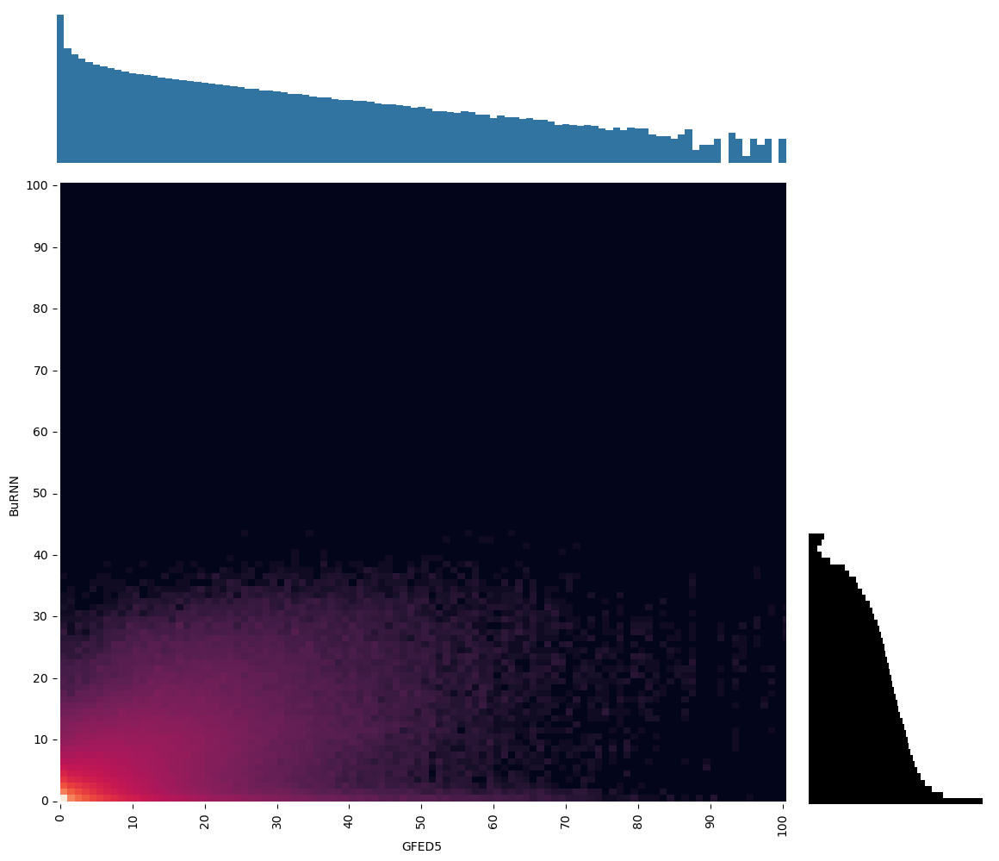

In [130]:
plt.figure(figsize=(12, 8))
full_range = range(101)
heatmap_data = pd.crosstab(y, x)
heatmap_data = heatmap_data.reindex(index=full_range, columns=full_range, fill_value=0)
log_data = np.log1p(heatmap_data)

# Marginal histograms
x_counts = np.bincount(x, minlength=101)
y_counts = np.bincount(y, minlength=101)

# Set up figure and axes using gridspec
fig = plt.figure(figsize=(14, 12))
gs = matplotlib.gridspec.GridSpec(2, 2, width_ratios=[4, 1], height_ratios=[1, 4],
                       wspace=0.05, hspace=0.05)

ax_heatmap = fig.add_subplot(gs[1, 0])
sns.heatmap(
    log_data,
    ax=ax_heatmap,
    cmap='rocket',
    cbar=False
)

plt.xlabel('GFED5')
plt.ylabel('BuRNN')
plt.xlim([0, 100])
plt.ylim([0, 100])
plt.xticks(np.arange(0, 101, 10), np.arange(0, 101, 10))
plt.yticks(np.arange(0, 101, 10), np.arange(0, 101, 10))

# Top histogram (BuRNN distribution)
ax_top_hist = fig.add_subplot(gs[0, 0], sharex=ax_heatmap)
sns.barplot(x=full_range, y=x_counts, ax=ax_top_hist, color=sns.color_palette()[0], errorbar=None, width=1)
ax_top_hist.set_yscale('log')
ax_top_hist.axis('off')  # Hide axes if you want a cleaner look
ax_top_hist.set_xlim(-0.5, 100.5)


# Side histogram (GFED5 distribution)
ax_side_hist = fig.add_subplot(gs[1, 1], sharey=ax_heatmap)
sns.barplot(y=full_range, x=y_counts, ax=ax_side_hist, color='k', errorbar=None, orient='h', width=1)
ax_side_hist.axis('off')
ax_side_hist.set_xscale('log')
ax_side_hist.set_ylim(-0.5, 100.5)
#ax_side_hist.invert_xaxis()
plt.tight_layout()

#### Folds

/apps/brussel/RL8/zen4/software/SciTools-Iris/3.9.0-foss-2023a/lib/python3.11/site-packages/iris/coords.py:2153: IrisVagueMetadataWarning: Cannot check if coordinate is contiguous: Invalid operation for 'time', with 0 bound(s). Contiguous bounds are only defined for 1D coordinates with 2 bounds. Metadata may not be fully descriptive for 'time'. Ignoring bounds.
  warnings.warn(


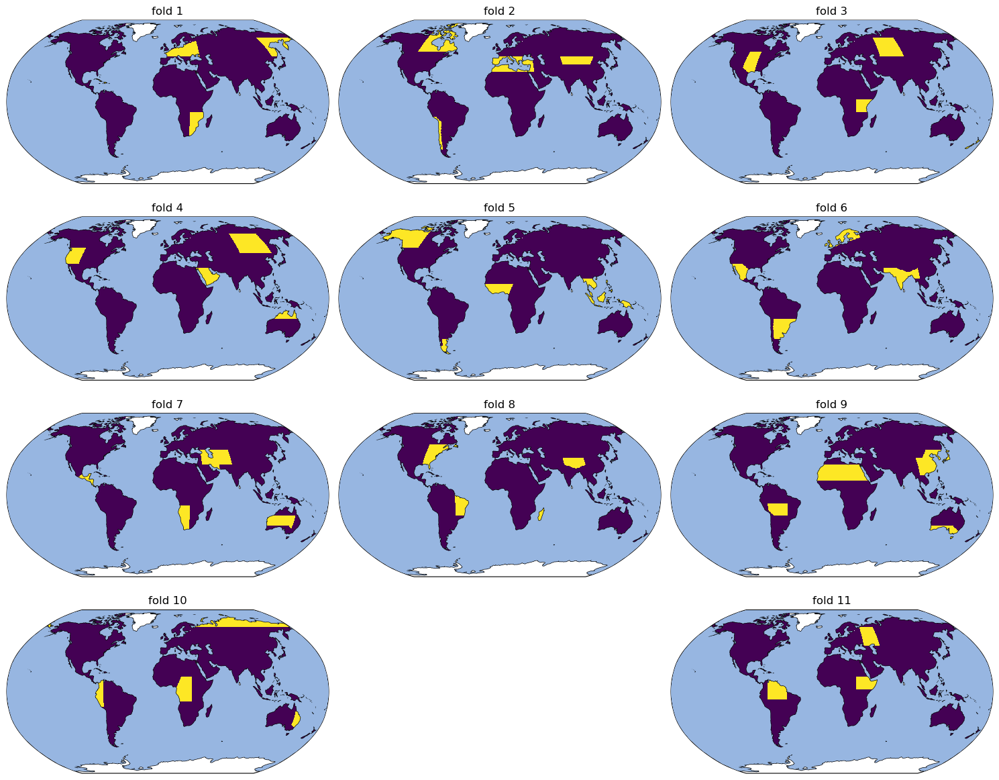

In [10]:
all_regions = [reg for fold in folds for reg in fold]
obs_mask = pixel_mean(obs_cube).data.mask

fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(15, 12), subplot_kw={'projection': ccrs.Robinson()})
axs = axs.ravel()
for idx, fold in enumerate(folds):
    ax = axs[idx]
    title = f'fold {idx+1}'
    if idx == len(folds)-1:
        ax.set_frame_on(False)
        idx+=1
        ax = axs[idx]

    cube = (~AR6_mask.loc[[abbrev in fold for abbrev in AR6_mask.abbrevs]]).sum(dim='region').rename({'lat': 'latitude', 'lon': 'longitude'})[::-1].to_iris()
    cube = iris.util.mask_cube(cube, obs_mask)
    for coord in ('latitude', 'longitude'):
        cube.coords(coord)[0].units = 'degrees'
        cube.coords(coord)[0].coord_system = cs
        cube.coords(coord)[0].guess_bounds()
        cube.coords(coord)[0].standard_name = coord
        cube.coords(coord)[0].var_name = coord[:3]
        cube.coords(coord)[0].long_name = coord.capitalize()

    mesh = iplt.pcolormesh(cube, axes=ax) #afmhot_r
    ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
    ax.add_feature(cartopy.feature.OCEAN, zorder=10)
    ax.set_title(title)
plt.tight_layout()
plt.savefig(os.path.join(figures_path, 'folds.png'), dpi=400)

#### Regional Evaluation (independent data)

In [45]:
from pyproj import CRS
shape_file = os.path.join(supplementary_data_path, 'EU_countries.gpkg')
shape_file = gpd.read_file(shape_file)
eu_shapes = shape_file.loc[shape_file.EU_STAT=='T'].drop(columns=['CNTR_NAME', 'NAME_FREN', 'ISO3_CODE', 'SVRG_UN', 'CAPT', 'EU_STAT', 'EFTA_STAT', 'CC_STAT', 'NAME_GERM']).set_index('CNTR_ID').set_crs('epsg:3035')
spherical_crs = CRS.from_proj4("+proj=longlat +a=6371229 +b=6371229 +no_defs")

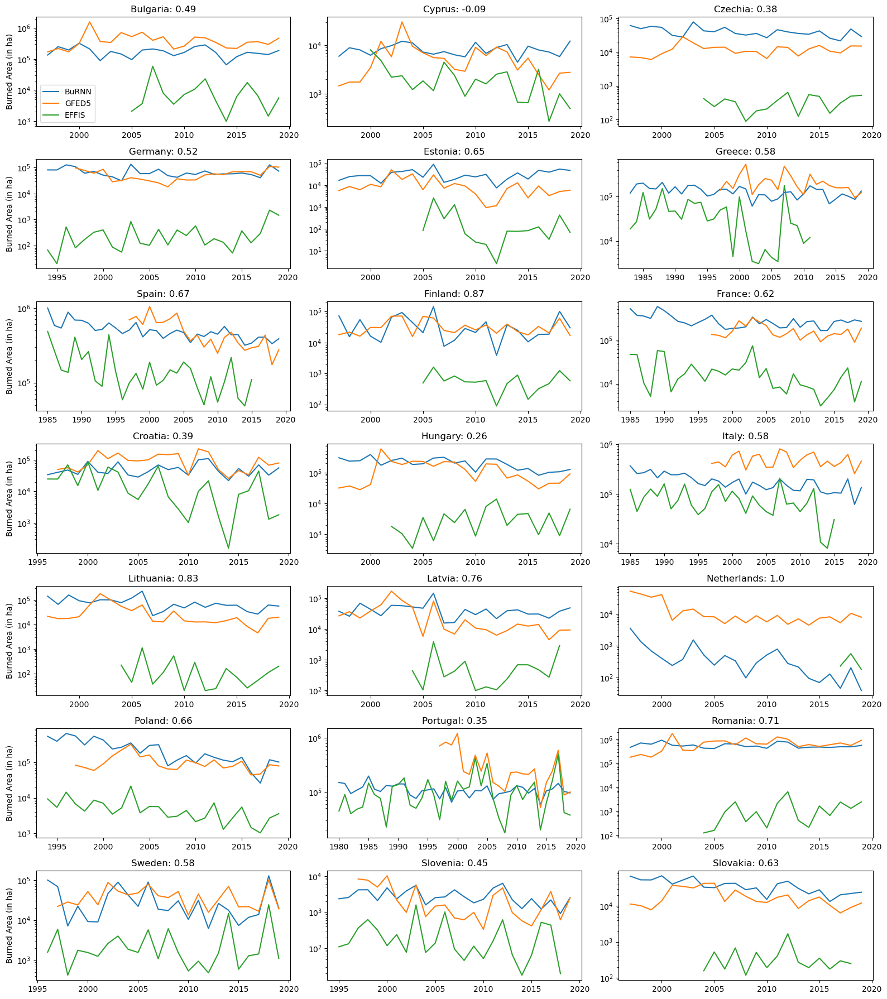

In [69]:
filename = os.path.join(supplementary_data_path, 'Monthly_BA_NOF_EU27.xlsx')
eu_ba = pd.read_excel(filename, sheet_name='Data')
eu_ba = eu_ba.set_index(['COUNTRY', 'YEAR', 'MONTH']).drop(columns=['NUTS3_2016', 'CountOfFIREID_EU']).groupby(['COUNTRY', 'YEAR']).sum().unstack('COUNTRY').T.droplevel(None).T

fig, axs = plt.subplots(7, 3, figsize=(16, 18))
axs = axs.ravel()
for idx, regionname in enumerate(eu_ba.columns):
    eu_region_df = eu_ba.loc[slice(None), regionname].dropna()
    
    gfed_region_ba = obs_da_mha.rio.write_crs(spherical_crs).rio.clip([eu_shapes.loc[regionname].geometry], crs='epsg:3035', drop=True).sum(dim=['lat', 'lon']).resample(time='Y').sum()
    gfed_region_ba['time'] = gfed_region_ba['time'].dt.year
    gfed_region_df = gfed_region_ba.to_pandas()
    
    predicted_region_da = predicted_da_mha.rio.write_crs(spherical_crs).rio.clip([eu_shapes.loc[regionname].geometry], crs='epsg:3035', drop=True).sum(dim=['lat', 'lon']).resample(time='Y').sum()
    predicted_region_da['time'] = predicted_region_da['time'].dt.year
    predicted_region_df = predicted_region_da.to_pandas()

    start_year = min(eu_region_df.index[0], gfed_region_df.index[0])       
    end_year = 2020
    predicted_region_df = predicted_region_df.loc[start_year:end_year]
    predicted_region_df.name = 'BuRNN'
    gfed_region_df.name = 'GFED5'
    eu_region_df.name = 'EFFIS'
    df = (predicted_region_df.to_frame().join(gfed_region_df)*10**6).join(eu_region_df)
    df.index.name = ''
    
    ax = axs[idx]
    plot = sns.lineplot(df, ax=ax, legend=not idx, dashes=False)
    plot.set(yscale='log')
    if not idx%3:
        plot.set(ylabel = 'Burned Area (in ha)')

    corr = pd.concat([predicted_region_df, eu_region_df], axis=1).corr().iloc[0, 1].round(2)

    ax.set_title(f'{eu_shapes.loc[regionname].NAME_ENGL}: {corr}')
plt.tight_layout()
plt.savefig(os.path.join(logs_path, 'eu_independent_eval.png'), dpi=400)

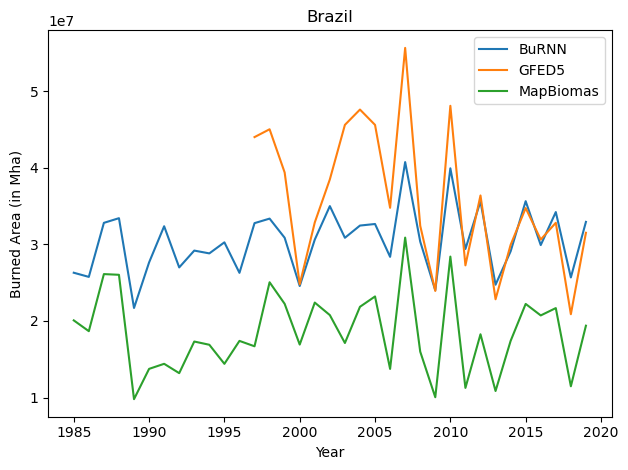

In [32]:
brasil_shape = shape_file.loc[shape_file.CNTR_NAME == 'Brasil'].drop(columns=['CNTR_NAME', 'NAME_FREN', 'ISO3_CODE', 'SVRG_UN', 'CAPT', 'EU_STAT', 'EFTA_STAT', 'CC_STAT', 'NAME_GERM']).set_crs('epsg:3035').iloc[0]
spherical_crs = CRS.from_proj4("+proj=longlat +a=6371229 +b=6371229 +no_defs")
brasil_data = os.path.join(supplementary_data_path, 'ba_observations', 'MapBiomas - Tabela de Dados.csv')
brasil_data_ha = pd.read_csv(brasil_data).drop(columns=['Classe']).squeeze(axis=0)
brasil_data_ha.index = brasil_data_ha.index.astype('int64')

gfed_region_ba = obs_da_mha.rio.write_crs(spherical_crs).rio.clip([brasil_shape.geometry], crs='epsg:3035', drop=True).sum(dim=['lat', 'lon']).resample(time='Y').sum()
gfed_region_ba['time'] = gfed_region_ba['time'].dt.year
gfed_region_df = gfed_region_ba.to_pandas()

predicted_region_da = predicted_da_mha.rio.write_crs(spherical_crs).rio.clip([brasil_shape.geometry], crs='epsg:3035', drop=True).sum(dim=['lat', 'lon']).resample(time='Y').sum()
predicted_region_da['time'] = predicted_region_da['time'].dt.year
predicted_region_df = predicted_region_da.to_pandas()

start_year = 1985       
end_year = 2020
predicted_region_df = predicted_region_df.loc[start_year:end_year]
predicted_region_df.name = 'BuRNN'
gfed_region_df.name = 'GFED5'
brasil_data_ha.name = 'MapBiomas'
df = (predicted_region_df.to_frame().join(gfed_region_df)*10**6).join(brasil_data_ha)
df.index.name = 'Year'

plot = sns.lineplot(df, legend=True, dashes=False)
#plot.set(yscale='log')
plot.set(ylabel = 'Burned Area (in Mha)', title='Brazil')

plt.tight_layout()

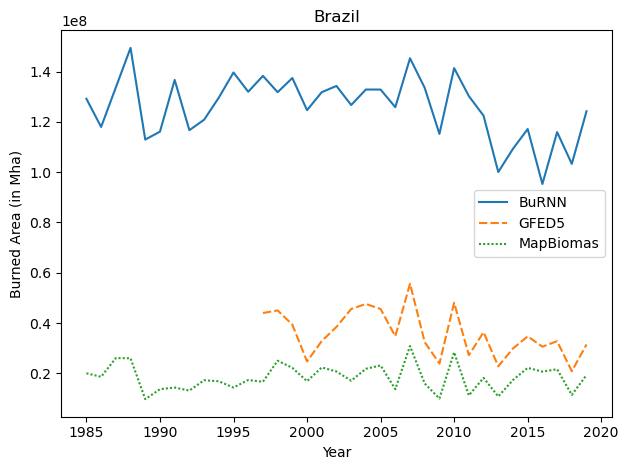

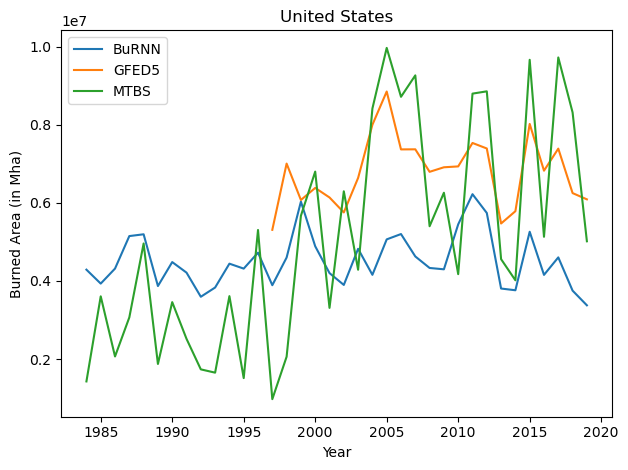

In [34]:
us_shape = shape_file.loc[shape_file.CNTR_ID == 'US'].drop(columns=['CNTR_NAME', 'NAME_FREN', 'ISO3_CODE', 'SVRG_UN', 'CAPT', 'EU_STAT', 'EFTA_STAT', 'CC_STAT', 'NAME_GERM']).set_crs('epsg:3035').iloc[0]
spherical_crs = CRS.from_proj4("+proj=longlat +a=6371229 +b=6371229 +no_defs")
us_data = os.path.join(supplementary_data_path, 'ba_observations', 'S_USA.MTBS_BURN_AREA_BOUNDARY.shp')
us_data = gpd.read_file(us_data).loc[slice(None), ['ACRES', 'YEAR']].groupby('YEAR').sum().squeeze(axis=1)
us_data.index.name = 'Year'

gfed_region_ba = obs_da_mha.rio.write_crs(spherical_crs).rio.clip([us_shape.geometry], crs='epsg:3035', drop=True).sum(dim=['lat', 'lon']).resample(time='Y').sum()
gfed_region_ba['time'] = gfed_region_ba['time'].dt.year
gfed_region_df = gfed_region_ba.to_pandas()

predicted_region_da = predicted_da_mha.rio.write_crs(spherical_crs).rio.clip([us_shape.geometry], crs='epsg:3035', drop=True).sum(dim=['lat', 'lon']).resample(time='Y').sum()
predicted_region_da['time'] = predicted_region_da['time'].dt.year
predicted_region_df = predicted_region_da.to_pandas()

start_year = 1984       
end_year = 2020
predicted_region_df = predicted_region_df.loc[start_year:end_year]
predicted_region_df.name = 'BuRNN'
gfed_region_df.name = 'GFED5'
us_data.name = 'MTBS'
df = (predicted_region_df.to_frame().join(gfed_region_df)*10**6).join(us_data)
df.index.name = 'Year'

plot = sns.lineplot(df, legend=True, dashes=False)
#plot.set(yscale='log')
plot.set(ylabel = 'Burned Area (in Mha)', title='United States')

plt.tight_layout()

GFED5    0.665605
NBAC     0.083465
NFDB    -0.110164
Name: BuRNN, dtype: float64
GFED5    0.508145
MTBS    -0.283063
FOD     -0.186525
Name: BuRNN, dtype: float64
GFED5        0.791681
MapBiomas    0.778152
Name: BuRNN, dtype: float64
GFED5   -0.234585
CONAF    0.325209
Name: BuRNN, dtype: float64
GFED5    0.374483
EFFIS   -0.095433
Name: BuRNN, dtype: float64
GFED5                0.913301
Regional agencies   -0.130502
Name: BuRNN, dtype: float64


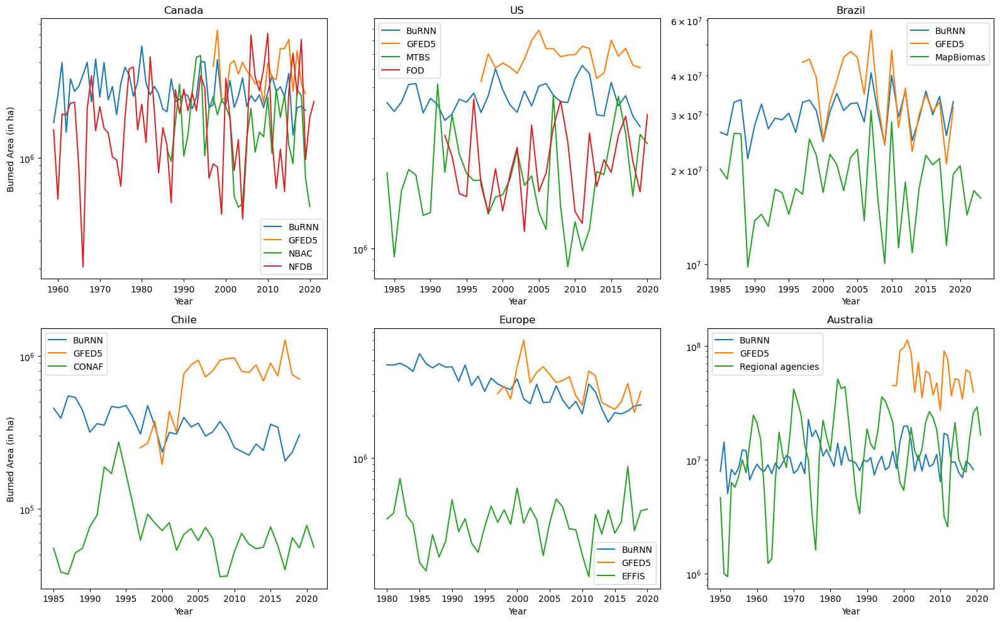

In [66]:
dirname = os.path.join(supplementary_data_path, 'ba_observations')
file_list = [os.path.join(dirname, filename) for filename in os.listdir(dirname) if filename.startswith('Monthly_Burned_area_')]
countries = [name.split('/')[-1].split('_')[5] for name in file_list]

australia_shape = shape_file.loc[shape_file.CNTR_NAME == 'Australia'].drop(columns=['CNTR_NAME', 'NAME_FREN', 'ISO3_CODE', 'SVRG_UN', 'CAPT', 'EU_STAT', 'EFTA_STAT', 'CC_STAT', 'NAME_GERM']).set_crs('epsg:3035').iloc[0].geometry
us_shape = shape_file.loc[shape_file.CNTR_ID == 'US'].drop(columns=['CNTR_NAME', 'NAME_FREN', 'ISO3_CODE', 'SVRG_UN', 'CAPT', 'EU_STAT', 'EFTA_STAT', 'CC_STAT', 'NAME_GERM']).set_crs('epsg:3035').iloc[0].geometry
from shapely.ops import unary_union
eu_shape = eu_shapes.drop(['AT', 'BE', 'DK', 'IE', 'LU', 'MT']).geometry.unary_union
canada_shape = shape_file.loc[shape_file.NAME_ENGL == 'Canada'].drop(columns=['CNTR_NAME', 'NAME_FREN', 'ISO3_CODE', 'SVRG_UN', 'CAPT', 'EU_STAT', 'EFTA_STAT', 'CC_STAT', 'NAME_GERM']).set_crs('epsg:3035').iloc[0].geometry
chile_shape = shape_file.loc[shape_file.NAME_ENGL == 'Chile'].drop(columns=['CNTR_NAME', 'NAME_FREN', 'ISO3_CODE', 'SVRG_UN', 'CAPT', 'EU_STAT', 'EFTA_STAT', 'CC_STAT', 'NAME_GERM']).set_crs('epsg:3035').iloc[0].geometry
brasil_shape = shape_file.loc[shape_file.CNTR_NAME == 'Brasil'].drop(columns=['CNTR_NAME', 'NAME_FREN', 'ISO3_CODE', 'SVRG_UN', 'CAPT', 'EU_STAT', 'EFTA_STAT', 'CC_STAT', 'NAME_GERM']).set_crs('epsg:3035').iloc[0].geometry
shape_dict = {'Australia': australia_shape, 'US': us_shape, 'Europe': eu_shape, 'Canada': canada_shape, 'Chile': chile_shape, 'Brazil': brasil_shape}

file_dict = {'CANADA': [file_list[2], file_list[4]], 'US': [file_list[0], file_list[5]], 'Brazil': os.path.join(supplementary_data_path, 'ba_observations', 'MapBiomas - Tabela de Dados.csv'), 'CHILE': file_list[3], 'EUROPE': file_list[-1], 'Australia': file_list[1]}
data_source = {'Brazil': 'MapBiomas', 'Chile': 'CONAF', 'Europe': 'EFFIS', 'Australia': 'Regional agencies'}

fig, axs = plt.subplots(2, 3, figsize=(16, 10))
axs = axs.ravel()
for idx, (countryname, filename) in enumerate(file_dict.items()):
    if countryname != 'US':
        countryname = countryname.capitalize()
    if isinstance(filename, list):
        country_data = pd.DataFrame()
        for file in filename:
            country_data_series = pd.read_csv(file).drop(columns=['lat', 'lon']).sum()
            country_data_series.index = pd.to_datetime([el[:7] for el in country_data_series.index], format="%Y-%m")
            country_data_series.name = file.split('/')[-1].split('_')[-2]
            country_data_series = country_data_series.resample('Y').sum()/10**4
            country_data = country_data.join(country_data_series, how='outer')
    else:
        if countryname == 'Brazil':
            country_data = pd.read_csv(filename).drop(columns=['Classe']).squeeze(axis=0)
            country_data.index = pd.to_datetime(country_data.index, format="%Y")
        else:
            country_data = pd.read_csv(filename).drop(columns=['lat', 'lon'])
            country_data[country_data > 1e20] = 0
            country_data = country_data.sum()
            country_data.index = pd.to_datetime([el[:7] for el in country_data.index], format="%Y-%m")
            country_data = country_data.resample('Y').sum()/10**4
        country_data.name = data_source[countryname]
    country_data.index = country_data.index.year

    gfed_region_ba = obs_da_mha.rio.write_crs(spherical_crs).rio.clip([shape_dict[countryname]], crs='epsg:3035', drop=True).sum(dim=['lat', 'lon']).resample(time='Y').sum()
    gfed_region_ba['time'] = gfed_region_ba['time'].dt.year
    gfed_region_df = gfed_region_ba.to_pandas()
    
    predicted_region_da = predicted_da_mha.rio.write_crs(spherical_crs).rio.clip([shape_dict[countryname]], crs='epsg:3035', drop=True).sum(dim=['lat', 'lon']).resample(time='Y').sum()
    predicted_region_da['time'] = predicted_region_da['time'].dt.year
    predicted_region_df = predicted_region_da.to_pandas()
    
    start_year = country_data.index[0]
    end_year = 2020
    predicted_region_df = predicted_region_df.loc[start_year:end_year]
    predicted_region_df.name = 'BuRNN'
    gfed_region_df.name = 'GFED5'
    df = (predicted_region_df.to_frame().join(gfed_region_df)*10**6).join(country_data, how='outer')
    df.index.name = 'Year'
    corr = df.corr()
    print(df.corr().iloc[0, 1:])

    ax = axs[idx]
    plot = sns.lineplot(df, legend=True, ax=ax, dashes=False)
    plot.set(yscale='log', title=countryname)
    if not idx%3:
        plot.set(ylabel = 'Burned Area (in ha)')
plt.tight_layout()
plt.savefig(os.path.join(logs_path, 'all_independent_eval.png'), dpi=400)

#### PoF

In [125]:
pof_loc = Path(os.path.join(supplementary_data_path, 'POF_BA'))
nc_files = sorted(pof_loc.glob("*.nc"))

pof = []
for f in nc_files:
    # Extract time info from filename
    match = re.search(r"(\d{4})_(\d{2})", f.name)
    if not match:
        continue  # skip files without date info
    year, month = map(int, match.groups())
    time = pd.Timestamp(f"{year}-{month:02d}-01")

    # Open the file
    ds = xr.open_dataset(f, engine='netcdf4')
    # Expand with time dimension
    ds = ds.expand_dims(time=[time])
    pof.append(ds)

# Concatenate along time
pof = xr.concat(pof, dim="time").Model_Prediction
pof = pof.coarsen(latitude=2, longitude=2).sum()
pof.attrs['units'] = '%'

pof = constrain_time(pof, 1997, 2019)
pof_cube = pof.to_iris()
for coord in ('latitude', 'longitude'):
    pof_cube.coords(coord)[0].guess_bounds()
    pof_cube.coords(coord)[0].units = 'degrees'
    pof_cube.coords(coord)[0].coord_system = cs
pof_cube.data = (pof_cube.data*10**6 / iris.analysis.cartography.area_weights(pof_cube))*100
time_unit = cf_units.Unit('days since 1901-01-01T00:00:00', calendar='standard')

time_coord = pof_cube.coords('time')[0]
time_coord.long_name = None
time_coord.standard_name = 'time'
time_coord.units = time_coord.units.change_calendar('standard')
date_values = time_coord.units.num2date(time_coord.points)
new_time_values = time_unit.date2num(date_values)
new_time_coord = iris.coords.DimCoord(new_time_values,
                                      standard_name='time',
                                      var_name='time',
                                      units=time_coord.units)
pof_cube.replace_coord(new_time_coord)
pof_cube.coords('time')[0].units = time_unit
pof_cube.var_name = pof_cube.long_name
pof_cube.long_name = 'PoF'

In [217]:
start_year, end_year = 2003, 2019


obs_cube_constrained = constrain_time(obs_cube, start_year, end_year)
predicted_cube_constrained = constrain_time(predicted_cube, start_year, end_year)
pof_cube_constrained = constrain_time(pof_cube, start_year, end_year)
print(f'{run_name}: {start_year} - {end_year}')
print('RMSE (in %)')
result = round(RMSE(predicted_cube_constrained, obs_cube_constrained), 2)
pof_result = round(RMSE(pof_cube_constrained, obs_cube_constrained), 2)
print('BuRNN', result)
print('PoF', pof_result)


warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(cube)
print('Spatio-Temporal Correlation')
result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
pof_result = round(xr.corr(pipeline(pof_cube_constrained).rename({'latitude': 'lat', 'longitude': 'lon'}), pipeline(obs_cube_constrained)).item(), 2)
print('BuRNN', result)
print('PoF', pof_result)


warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
print('Spatial Correlation')
result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
pof_result = round(xr.corr(pipeline(pof_cube_constrained).rename({'latitude': 'lat', 'longitude': 'lon'}), pipeline(obs_cube_constrained)).item(), 2)
print('BuRNN', result)
print('PoF', pof_result)

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
print('Temporal Correlation (monthly)')
result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
pof_result = round(xr.corr(pipeline(pof_cube_constrained).rename({'latitude': 'lat', 'longitude': 'lon'}), pipeline(obs_cube_constrained)).item(), 2)
print('BuRNN', result)
print('PoF', pof_result)

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
print('Temporal Correlation (yearly)')
result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
pof_result = round(xr.corr(pipeline(pof_cube_constrained).rename({'latitude': 'lat', 'longitude': 'lon'}), pipeline(obs_cube_constrained)).item(), 2)
print('BuRNN', result)
print('PoF', pof_result)

from numpy.linalg import lstsq
warnings.simplefilter(action="ignore", category=iris.warnings.IrisUserWarning)
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
def calculate_trend(cube):
    y = to_annual(to_global(to_mha(cube))).data
    x = np.arange(len(y))
    res = stats.linregress(x, y)
    # Two-sided inverse Students t-distribution
    # p - probability, df - degrees of freedom
    tinv = lambda p, df: abs(stats.t.ppf(p/2, df))
    ts = tinv(0.05, len(x)-2)
    return f"{res.slope:.2f} ± {ts*res.stderr:.2f}"
    #print(f"slope (95%): {res.slope:.6f} +/- {ts*res.stderr:.6f}")
    #print(f"intercept (95%): {res.intercept:.6f}" f" +/- {ts*res.intercept_stderr:.6f}")
print('Trend (in Mha per year)')
print('GFED5', calculate_trend(obs_cube_constrained))
print('BuRNN', calculate_trend(predicted_cube_constrained))
print('PoF', calculate_trend(pof_cube_constrained))


warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
print('Spatial RMSE (in %)')
result = round(RMSE(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)), 2)
pof_result = round(RMSE(pipeline(pof_cube_constrained).rename({'latitude': 'lat', 'longitude': 'lon'}), pipeline(obs_cube_constrained)), 2)
print('BuRNN', result)
print('PoF', pof_result)

mse_1_64_log_None_ReLU_1lambda: 2003 - 2019
RMSE (in %)
BuRNN 1.8
PoF 2.56
Spatio-Temporal Correlation
BuRNN 0.67
PoF 0.59
Spatial Correlation
BuRNN 0.86
PoF 0.69
Temporal Correlation (monthly)
BuRNN 0.76
PoF 0.65
Temporal Correlation (yearly)
BuRNN 0.81
PoF 0.75
Trend (in Mha per year)
GFED5 -8.98 ± 2.90
BuRNN -1.72 ± 0.86
PoF -9.18 ± 4.62
Spatial RMSE (in %)
BuRNN 0.71
PoF 1.4


#### Global Table

In [ ]:
# Define the mean and stddev for each row
means = results_df.mean(axis=1)
stddevs = results_df.std(axis=1)
inverse = [True, True, False, False, False, False]

# Function to map a value to a color
def color_map(val, mean, stddev, inverse):
    normalized_val = (val - mean) / (2*stddev)
    if normalized_val > 1:
        normalized_val = 1
    elif normalized_val < -1:
        normalized_val = -1
    # Map normalized value to a color in the BrBG colormap
    if inverse:
        color = plt.cm.RdYlBu_r((normalized_val + 1) / 2)
    else:
        color = plt.cm.RdYlBu((normalized_val + 1) / 2) #BrBG
    return f'background-color: rgb({int(color[0]*255)}, {int(color[1]*255)}, {int(color[2]*255)})'

results_df.columns = [results_df.columns[0]] + [el.upper() for el in results_df.columns[1:]]
# Apply the style
styled_df = results_df.style.set_properties(**{'height': '50px'}).apply(lambda x: [color_map(val, mean, stddev, inverse) for val, mean, stddev, inverse in zip(x, means, stddevs, inverse)], axis=0)


latex_code = styled_df.format(precision=2).to_latex(hrules=False, 
                                                    caption='Global evaluation scores of \gls{model} and the FireMIP models.', 
                                                    convert_css=True,
                                                    position_float='centering'
                                                    )

In [36]:
print(' \hhline{~----------}  \n'.join(latex_code.split('\n')[5:-3]))

\gls{rmse} & {\cellcolor[rgb]{0.247, 0.392, 0.675}} 1.67 & {\cellcolor[rgb]{0.867, 0.945, 0.969}} 2.18 & {\cellcolor[rgb]{0.737, 0.086, 0.149}} 3.07 & {\cellcolor[rgb]{0.835, 0.929, 0.961}} 2.16 & {\cellcolor[rgb]{0.961, 0.984, 0.812}} 2.30 & {\cellcolor[rgb]{0.976, 0.988, 0.788}} 2.32 & {\cellcolor[rgb]{0.996, 0.980, 0.722}} 2.37 & {\cellcolor[rgb]{0.949, 0.416, 0.255}} 2.83 & {\cellcolor[rgb]{0.655, 0.839, 0.906}} 2.02 & {\cellcolor[rgb]{0.992, 0.816, 0.506}} 2.56 \\ \hhline{~----------}  
Spatial \gls{rmse} & {\cellcolor[rgb]{0.231, 0.337, 0.643}} 0.50 & {\cellcolor[rgb]{0.937, 0.976, 0.855}} 0.87 & {\cellcolor[rgb]{0.992, 0.871, 0.557}} 1.02 & {\cellcolor[rgb]{0.843, 0.933, 0.961}} 0.82 & {\cellcolor[rgb]{0.906, 0.961, 0.918}} 0.85 & {\cellcolor[rgb]{0.996, 0.953, 0.678}} 0.96 & {\cellcolor[rgb]{0.953, 0.980, 0.831}} 0.89 & {\cellcolor[rgb]{0.906, 0.322, 0.212}} 1.24 & {\cellcolor[rgb]{0.714, 0.871, 0.925}} 0.75 & {\cellcolor[rgb]{0.792, 0.137, 0.149}} 1.32 \\ \hhline{~----------} 

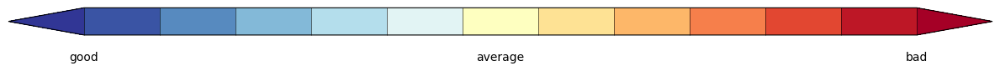

In [37]:
# Settings
n_bins = 11
figsize = (12, 1)

# Get the original colormap
orig_cmap = plt.get_cmap('RdYlBu_r')

# Create a new colormap shifted inward
new_colors = orig_cmap(np.linspace(0.05, 0.95, n_bins))
new_cmap = mcolors.ListedColormap(new_colors)

# Create a ScalarMappable with the shifted colormap
boundaries = np.linspace(0, 1, n_bins + 1)
norm = mcolors.BoundaryNorm(boundaries=boundaries, ncolors=n_bins)

# Build the figure
fig, ax = plt.subplots(figsize=figsize)
fig.subplots_adjust(bottom=0.5)

sm = plt.cm.ScalarMappable(norm=norm, cmap=new_cmap)

# Create the colorbar with original extension colors
cbar = fig.colorbar(
    sm,
    cax=ax,
    orientation='horizontal',
    extend='both',
    extendfrac='auto',
    ticks=[],
    drawedges=True,
)

# Set the extension colors manually to original colormap extremes
cbar.cmap.set_under(orig_cmap(0.0))  # Deep color for low extension
cbar.cmap.set_over(orig_cmap(1.0))   # Deep color for high extension
sm.set_cmap(cbar.cmap)  # Update mappable with new cmap including extensions

ax.minorticks_off()

# Add manual labels
fontsize=10
ax.text(0, -0.8, 'good', ha='center', va='center', transform=ax.transAxes, fontsize=fontsize)
ax.text(0.5, -0.8, 'average', ha='center', va='center', transform=ax.transAxes, fontsize=fontsize)
ax.text(1, -0.8, 'bad', ha='center', va='center', transform=ax.transAxes, fontsize=fontsize)
plt.tight_layout()
plt.savefig(os.path.join(supplementary_output_path, 'table_cbar.png'), dpi=400)
plt.show()

#### Regional Ranked Table

In [14]:
static_results_gfed = pd.read_csv(os.path.join(supplementary_output_path, 'static_results_regional.csv'), header=[0, 1], index_col=0)
results_gfed = pd.read_csv(os.path.join(logs_path, 'results_regional.csv'), index_col=0)

results_gfed_combined = deepcopy(static_results_gfed)
for region in results_gfed.columns:
    results_gfed_combined.loc[slice(None), (region, 'BuRNN')] = results_gfed.loc[slice(None), region]
results_gfed_combined = results_gfed_combined.sort_index(axis=1,level=[0,1])

results_gfed_combined = results_gfed_combined.rename({'rmse': '\gls{rmse}', 'spatial_rmse': 'Spatial \gls{rmse}', 'corr': 'Correlation', 'spatial_corr': 'Spatial Correlation', 'monthly_corr': 'Monthly Correlation', 'yearly_corr': 'Yearly Correlation'})

ranking_df = pd.DataFrame(index=results_gfed_combined.index,
                          columns=results_gfed_combined.columns.unique(level='Region'))

for region in ranking_df.columns:
    for metric in results_gfed_combined.index:
        # Get the scores.
        metric_scores = results_gfed_combined.loc[metric, region]
        
        # For rmse metrics (assumed to start with 'rmse') lower is better;
        # for correlations, higher is better.
        if 'rmse' in metric:
            rank = metric_scores.rank(method='min', ascending=True)['BuRNN']
        else:
            rank = metric_scores.rank(method='min', ascending=False)['BuRNN']
        
        # Save the rank as an integer (1 being best)
        ranking_df.loc[metric, region] = int(rank)
ranking_df

Region,AUST,BOAS,BONA,CEAM,CEAS,EQAS,EURO,MIDE,NHAF,NHSA,SEAS,SHAF,SHSA,TENA
\gls{rmse},2,1,1,1,1,2,1,1,1,1,1,1,1,1
Spatial \gls{rmse},5,1,1,1,1,3,1,1,1,1,1,1,1,1
Correlation,1,1,1,1,1,3,1,1,1,1,1,1,1,1
Spatial Correlation,3,1,1,1,1,3,1,1,1,1,1,1,1,1
Monthly Correlation,1,1,5,2,1,2,1,1,1,2,1,1,1,1
Yearly Correlation,1,1,1,1,1,7,1,1,4,2,2,1,1,4


In [15]:
n_bins = 10

# Get the original colormap
orig_cmap = plt.get_cmap('RdYlBu_r')

# Create a new colormap shifted inward
new_colors = orig_cmap(np.linspace(0, 1, n_bins))
new_cmap = mcolors.ListedColormap(new_colors)

# Create a ScalarMappable with the shifted colormap
boundaries = np.linspace(0, 1, n_bins + 1)
norm = mcolors.BoundaryNorm(boundaries=boundaries, ncolors=n_bins)


def color_from_rank(rank):
    return f'background-color: {mcolors.rgb2hex(new_cmap(rank-1))}'

rank_copy = deepcopy(ranking_df)
rank_copy.index = pd.Index(['{'+ f'\scriptsize {index}' + '}' for index in rank_copy.index])

style_df = rank_copy.applymap(color_from_rank)

results_copy = deepcopy(results_gfed_combined).loc[slice(None), (slice(None), 'BuRNN')].droplevel('Model', axis=1)
results_copy.index = pd.Index(['{'+ f'\scriptsize {index}' + '}' for index in results_copy.index])

styled_predicted = results_copy.style.format(precision=2).apply(lambda _: style_df, axis=None)

styled_predicted

Region,AUST,BOAS,BONA,CEAM,CEAS,EQAS,EURO,MIDE,NHAF,NHSA,SEAS,SHAF,SHSA,TENA
{\scriptsize \gls{rmse}},2.67,1.20,0.41,1.25,1.16,0.64,0.40,0.30,3.51,0.68,2.55,3.43,0.88,0.38
{\scriptsize Spatial \gls{rmse}},0.96,0.30,0.06,0.37,0.27,0.20,0.11,0.11,1.01,0.25,0.88,1.05,0.29,0.10
{\scriptsize Correlation},0.33,0.43,0.18,0.52,0.35,0.37,0.32,0.19,0.77,0.63,0.59,0.74,0.53,0.15
{\scriptsize Spatial Correlation},0.57,0.69,0.49,0.63,0.64,0.47,0.63,0.36,0.93,0.81,0.64,0.89,0.67,0.38
{\scriptsize Monthly Correlation},0.84,0.90,0.55,0.83,0.76,0.88,0.75,0.79,0.97,0.93,0.94,0.99,0.95,0.73
{\scriptsize Yearly Correlation},0.91,0.63,0.74,0.79,0.70,0.89,0.50,0.42,0.74,0.73,0.54,0.63,0.74,0.66


In [16]:
latex_code = styled_predicted.to_latex(hrules=False, 
                                        caption='Regional ranking scores of \gls{model} and the FireMIP models.', 
                                        convert_css=True,
                                        position_float='centering'
                                        )

In [17]:
print(' \hhline{~--------------}  \n'.join(latex_code.split('\n')[5:-3]))

{\scriptsize \gls{rmse}} & {\cellcolor[HTML]{4A7AB7}} 2.67 & {\cellcolor[HTML]{313695}} 1.20 & {\cellcolor[HTML]{313695}} 0.41 & {\cellcolor[HTML]{313695}} 1.25 & {\cellcolor[HTML]{313695}} 1.16 & {\cellcolor[HTML]{4A7AB7}} 0.64 & {\cellcolor[HTML]{313695}} 0.40 & {\cellcolor[HTML]{313695}} 0.30 & {\cellcolor[HTML]{313695}} 3.51 & {\cellcolor[HTML]{313695}} 0.68 & {\cellcolor[HTML]{313695}} 2.55 & {\cellcolor[HTML]{313695}} 3.43 & {\cellcolor[HTML]{313695}} 0.88 & {\cellcolor[HTML]{313695}} 0.38 \\ \hhline{~--------------}  
{\scriptsize Spatial \gls{rmse}} & {\cellcolor[HTML]{EDF8DF}} 0.96 & {\cellcolor[HTML]{313695}} 0.30 & {\cellcolor[HTML]{313695}} 0.06 & {\cellcolor[HTML]{313695}} 0.37 & {\cellcolor[HTML]{313695}} 0.27 & {\cellcolor[HTML]{7FB6D6}} 0.20 & {\cellcolor[HTML]{313695}} 0.11 & {\cellcolor[HTML]{313695}} 0.11 & {\cellcolor[HTML]{313695}} 1.01 & {\cellcolor[HTML]{313695}} 0.25 & {\cellcolor[HTML]{313695}} 0.88 & {\cellcolor[HTML]{313695}} 1.05 & {\cellcolor[HTML]{313695}}

#### Regional Ranked Table (FireCCi5.1)

In [41]:
static_results_gfed = pd.read_csv(os.path.join(supplementary_output_path, 'static_results_regional_firecci51.csv'), header=[0, 1], index_col=0)
results_gfed = pd.read_csv(os.path.join(logs_path, 'results_regional_firecci51.csv'), index_col=0)

results_gfed_combined = deepcopy(static_results_gfed)
for region in results_gfed.columns:
    results_gfed_combined.loc[slice(None), (region, 'BuRNN')] = results_gfed.loc[slice(None), region]
results_gfed_combined = results_gfed_combined.sort_index(axis=1,level=[0,1])

results_gfed_combined = results_gfed_combined.rename({'rmse': '\gls{rmse}', 'spatial_rmse': 'Spatial \gls{rmse}', 'corr': 'Correlation', 'spatial_corr': 'Spatial Correlation', 'monthly_corr': 'Monthly Correlation', 'yearly_corr': 'Yearly Correlation'})

ranking_df = pd.DataFrame(index=results_gfed_combined.index,
                          columns=results_gfed_combined.columns.unique(level='Region'))

for region in ranking_df.columns:
    for metric in results_gfed_combined.index:
        # Get the scores.
        metric_scores = results_gfed_combined.loc[metric, region]
        
        # For rmse metrics (assumed to start with 'rmse') lower is better;
        # for correlations, higher is better.
        if 'rmse' in metric:
            rank = metric_scores.rank(method='min', ascending=True)['BuRNN']
        else:
            rank = metric_scores.rank(method='min', ascending=False)['BuRNN']
        
        # Save the rank as an integer (1 being best)
        ranking_df.loc[metric, region] = int(rank)
ranking_df

Region,AUST,BOAS,BONA,CEAM,CEAS,EQAS,EURO,MIDE,NHAF,NHSA,SEAS,SHAF,SHSA,TENA
\gls{rmse},2,1,2,1,1,4,1,1,1,1,3,1,1,1
Spatial \gls{rmse},4,1,3,1,1,6,1,1,1,1,9,1,1,1
Correlation,1,1,1,1,1,2,1,1,1,1,1,1,1,3
Spatial Correlation,4,1,3,1,1,3,1,1,1,1,2,1,1,2
Monthly Correlation,1,1,8,3,5,1,1,1,1,3,3,1,2,1
Yearly Correlation,1,1,1,1,1,1,2,1,1,3,1,3,1,6


In [42]:
n_bins = 10

# Get the original colormap
orig_cmap = plt.get_cmap('RdYlBu_r')

# Create a new colormap shifted inward
new_colors = orig_cmap(np.linspace(0, 1, n_bins))
new_cmap = mcolors.ListedColormap(new_colors)

# Create a ScalarMappable with the shifted colormap
boundaries = np.linspace(0, 1, n_bins + 1)
norm = mcolors.BoundaryNorm(boundaries=boundaries, ncolors=n_bins)


def color_from_rank(rank):
    return f'background-color: {mcolors.rgb2hex(new_cmap(rank-1))}'

rank_copy = deepcopy(ranking_df)
rank_copy.index = pd.Index(['{'+ f'\scriptsize {index}' + '}' for index in rank_copy.index])

style_df = rank_copy.applymap(color_from_rank)

results_copy = deepcopy(results_gfed_combined).loc[slice(None), (slice(None), 'BuRNN')].droplevel('Model', axis=1)
results_copy.index = pd.Index(['{'+ f'\scriptsize {index}' + '}' for index in results_copy.index])

styled_predicted = results_copy.style.format(precision=2).apply(lambda _: style_df, axis=None)

styled_predicted

Region,AUST,BOAS,BONA,CEAM,CEAS,EQAS,EURO,MIDE,NHAF,NHSA,SEAS,SHAF,SHSA,TENA
{\scriptsize \gls{rmse}},2.78,0.95,0.42,0.53,1.10,0.46,0.29,0.23,2.97,0.76,1.49,3.32,0.93,0.45
{\scriptsize Spatial \gls{rmse}},0.84,0.18,0.05,0.24,0.22,0.23,0.08,0.08,0.86,0.27,0.55,0.91,0.27,0.09
{\scriptsize Correlation},0.28,0.34,0.08,0.33,0.21,0.31,0.30,0.16,0.71,0.54,0.35,0.67,0.42,0.08
{\scriptsize Spatial Correlation},0.55,0.61,0.20,0.40,0.43,0.40,0.59,0.29,0.86,0.70,0.48,0.84,0.58,0.18
{\scriptsize Monthly Correlation},0.81,0.86,0.25,0.84,0.47,0.91,0.76,0.78,0.95,0.82,0.80,0.97,0.89,0.60
{\scriptsize Yearly Correlation},0.92,0.73,0.51,0.70,0.75,0.96,0.52,0.46,0.66,0.62,0.28,0.27,0.94,0.67


In [16]:
latex_code = styled_predicted.to_latex(hrules=False, 
                                        caption='Regional ranking scores of \gls{model} and the FireMIP models.', 
                                        convert_css=True,
                                        position_float='centering'
                                        )

In [17]:
print(' \hhline{~--------------}  \n'.join(latex_code.split('\n')[5:-3]))

{\scriptsize \gls{rmse}} & {\cellcolor[HTML]{4A7AB7}} 2.67 & {\cellcolor[HTML]{313695}} 1.20 & {\cellcolor[HTML]{313695}} 0.41 & {\cellcolor[HTML]{313695}} 1.25 & {\cellcolor[HTML]{313695}} 1.16 & {\cellcolor[HTML]{4A7AB7}} 0.64 & {\cellcolor[HTML]{313695}} 0.40 & {\cellcolor[HTML]{313695}} 0.30 & {\cellcolor[HTML]{313695}} 3.51 & {\cellcolor[HTML]{313695}} 0.68 & {\cellcolor[HTML]{313695}} 2.55 & {\cellcolor[HTML]{313695}} 3.43 & {\cellcolor[HTML]{313695}} 0.88 & {\cellcolor[HTML]{313695}} 0.38 \\ \hhline{~--------------}  
{\scriptsize Spatial \gls{rmse}} & {\cellcolor[HTML]{EDF8DF}} 0.96 & {\cellcolor[HTML]{313695}} 0.30 & {\cellcolor[HTML]{313695}} 0.06 & {\cellcolor[HTML]{313695}} 0.37 & {\cellcolor[HTML]{313695}} 0.27 & {\cellcolor[HTML]{7FB6D6}} 0.20 & {\cellcolor[HTML]{313695}} 0.11 & {\cellcolor[HTML]{313695}} 0.11 & {\cellcolor[HTML]{313695}} 1.01 & {\cellcolor[HTML]{313695}} 0.25 & {\cellcolor[HTML]{313695}} 0.88 & {\cellcolor[HTML]{313695}} 1.05 & {\cellcolor[HTML]{313695}}

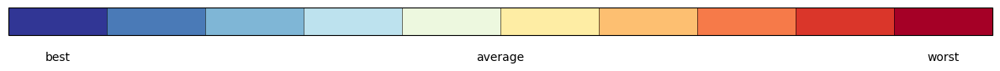

In [129]:
# Settings
figsize = (12, 1)

# Build the figure
fig, ax = plt.subplots(figsize=figsize)
fig.subplots_adjust(bottom=0.5)

sm = plt.cm.ScalarMappable(norm=norm, cmap=new_cmap)

# Create the colorbar with original extension colors
cbar = fig.colorbar(
    sm,
    cax=ax,
    orientation='horizontal',
    ticks=[],
    drawedges=True,
)

# Set the extension colors manually to original colormap extremes
cbar.cmap.set_under(orig_cmap(0.0))  # Deep color for low extension
cbar.cmap.set_over(orig_cmap(1.0))   # Deep color for high extension
sm.set_cmap(cbar.cmap)  # Update mappable with new cmap including extensions

ax.minorticks_off()

# Add manual labels
fontsize=10
ax.text(0.05, -0.8, 'best', ha='center', va='center', transform=ax.transAxes, fontsize=fontsize)
ax.text(0.5, -0.8, 'average', ha='center', va='center', transform=ax.transAxes, fontsize=fontsize)
ax.text(0.95, -0.8, 'worst', ha='center', va='center', transform=ax.transAxes, fontsize=fontsize)
plt.tight_layout()
plt.savefig(os.path.join(supplementary_output_path, 'table_regions_cbar.png'), dpi=400)
plt.show()

#### Regional evaluation tables

In [150]:
region_tables = {}
for region in results_gfed_combined.columns.unique(level='Region'):
    region_data = deepcopy(results_gfed_combined.loc[slice(None), (region)])
    # Define the mean and stddev for each row
    means = region_data.mean(axis=1)
    stddevs = region_data.std(axis=1)
    inverse = [True, True, False, False, False, False]
    
    # Function to map a value to a color
    def color_map(val, mean, stddev, inverse):
        normalized_val = (val - mean) / (2*stddev)
        if normalized_val > 1:
            normalized_val = 1
        elif normalized_val < -1:
            normalized_val = -1
        # Map normalized value to a color in the BrBG colormap
        if inverse:
            color = plt.cm.RdYlBu_r((normalized_val + 1) / 2)
        else:
            color = plt.cm.RdYlBu((normalized_val + 1) / 2) #BrBG
        return f'background-color: rgb({int(color[0]*255)}, {int(color[1]*255)}, {int(color[2]*255)})'
    
    region_data.columns = ['{\\scriptsize ' + '\\gls{model}' + '}'] + ['{\\scriptsize ' + el.upper() + '}' for el in region_data.columns[1:]]
    region_data.index = pd.Index(['{\scriptsize ' + index + '}' for index in region_data.index])
    # Apply the style
    styled_df = region_data.style.set_properties(**{'height': '50px'}).apply(lambda x: [color_map(val, mean, stddev, inverse) for val, mean, stddev, inverse in zip(x, means, stddevs, inverse)], axis=0)
    
    region_tables[region] = styled_df
    latex_code = styled_df.format(precision=2).to_latex(hrules=False, 
                                                        caption='Evaluation scores of \gls{model} and the FireMIP models in \gls' +'{' + region.lower() + '}. Colour scaling is based on the normalized values with the minimum and maximum values set to -2 and 2 (sigma). Better scores are marked in blue, while worse performance is in red.', 
                                                        convert_css=True,
                                                        position_float='centering',
                                                        label=f'tab:evaluation_{region}'
                                                        )
    region_tables[region] = latex_code

In [ ]:
for latex_code in region_tables.values():
    latex_code = latex_code.split('\n')
    print(' \n'.join(latex_code[:4]))
    print('\\begin{tabularx}{\\textwidth}{p{1.5cm} *{11}{Y}}')
    print(latex_code[5] + ' \\hhline{~----------}')
    print('\\end{tabularx}')
    print('\\begin{tabularx}{\\textwidth}{p{1.5cm} | *{11}{Y |}}')
    print('[3.5ex] \\hhline{~----------}  \n'.join(latex_code[6:9]) + '[3.5ex] \\hhline{~----------}')
    print(' \\hhline{~----------}  \n'.join(latex_code[9:-3]) + ' \\hhline{~----------}')
    print('\\end{tabularx}')
    print(' \n'.join(latex_code[-2:]))

#### Correlation (maps)

In [10]:
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
mask = ~np.isnan(xr.DataArray.from_iris(pixel_mean(obs_cube)).stack(pixel=['lat', 'lon']).values)
def get_pixel_corr(cube1, cube2, mask):
    da1 = xr.DataArray.from_iris(cube1)
    da2 = xr.DataArray.from_iris(cube2)
    corr = xr.corr(da1, da2, dim='time')
    corr = corr.stack(pixel=['lat', 'lon'])[mask].dropna(dim='pixel')
    return corr
print('Temporal Correlation (pixel level)')
print('BuRNN', round(get_pixel_corr(predicted_cube, obs_cube, mask).values.mean(), 2))
for model in model_cubelist:
    print(model.long_name, round(get_pixel_corr(model, obs_cube, mask).values.mean(), 2))

Temporal Correlation (pixel level)
BuRNN 0.32
classic 0.22
elm-eca 0.1
jules-inferno-vn6p3 0.2
lpj-guess-simfire-blaze 0.11
lpj-guess-spitfire 0.17
lpjml5-7-10-fire 0.14
orchidee-mict 0.13
ssib4-triffid-fire 0.21
visit 0.15


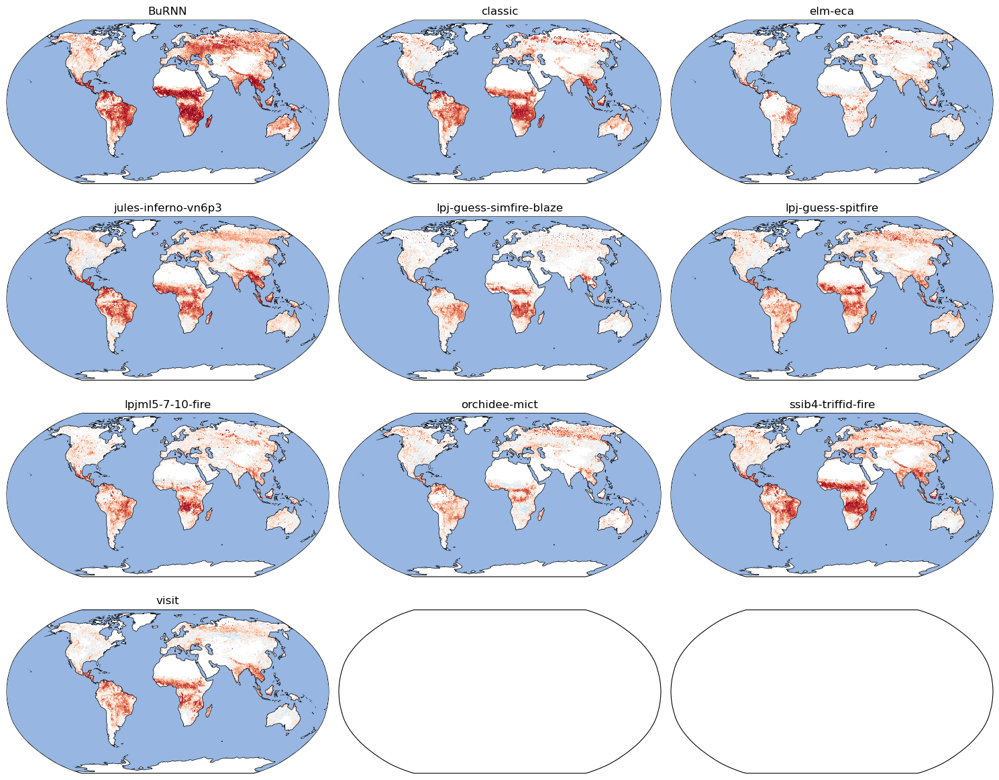

In [11]:
corr_maps = xr.Dataset()
def get_pixel_corr_map(cube1, cube2):
    da1 = xr.DataArray.from_iris(cube1)
    da2 = xr.DataArray.from_iris(cube2)
    corr = xr.corr(da1, da2, dim='time')
    return corr
corr_maps['BuRNN'] = get_pixel_corr_map(predicted_cube, obs_cube)
for model in model_cubelist:
    corr_maps[model.long_name] = get_pixel_corr_map(model, obs_cube)

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
number_of_plots = len(corr_maps)
fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(15, 12), subplot_kw={'projection': ccrs.Robinson()})
axs = axs.ravel()
for idx, name in enumerate(corr_maps):
    ax = axs[idx]
    da = corr_maps[name]
    da.attrs['standard_name'] = None
    cube = da.to_iris()
    for coord in ('longitude', 'latitude'):
        cube.coords(coord)[0].guess_bounds()
    iplt.pcolormesh(cube, vmin=-1, vmax=1, axes=ax, cmap="RdBu_r")
    ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
    ax.add_feature(cartopy.feature.OCEAN, zorder=10)
    ax.set_title(name)
plt.tight_layout()
plt.savefig(os.path.join(figures_path, 'global_corr.png'), dpi=300)
warnings.simplefilter(action="default", category=iris.warnings.IrisVagueMetadataWarning)

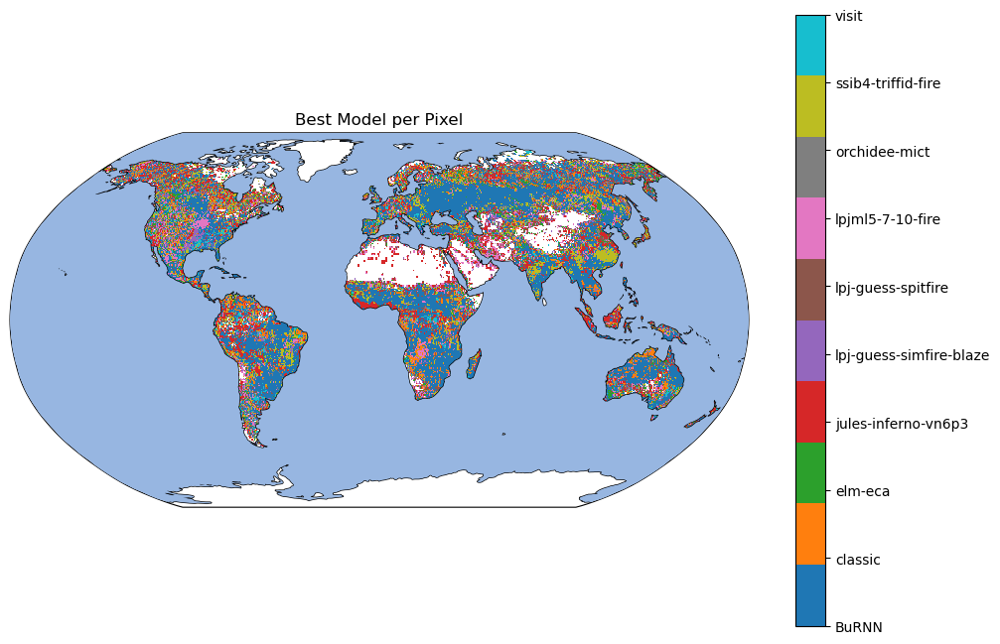

In [12]:
# Assume ds is your Dataset with 8 model performance variables and spatial dimensions "lat" and "lon"
models = list(corr_maps.data_vars.keys())

# Step 1: Concatenate along a new 'model' dimension
perf = xr.concat([corr_maps[m] for m in models], dim='model')
perf = perf.assign_coords(model=models)

# Create a mask for pixels where all values are NaN
mask_all_nan = perf.isnull().all(dim='model')

# Step 2: Fill NaN values with -infinity so they don’t interfere with argmax
perf_filled = perf.fillna(-np.inf)

# Find the index of the best model (highest performance) for each pixel
best_model_idx = perf_filled.argmax(dim='model')

# Optionally, set pixels that originally had all NaNs back to NaN in the result
best_model_idx = best_model_idx.where(~mask_all_nan)

# Create a figure and an axes with the Robinson projection.
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection=ccrs.Robinson())

# Plot the best model DataArray.
# Since the data is in lat/lon coordinates, we use transform=ccrs.PlateCarree().
cmap = plt.get_cmap("tab10", len(models))
im = best_model_idx.plot(
    ax=ax,
    transform=ccrs.PlateCarree(),
    cmap=cmap,
    add_colorbar=False
)

# Add Cartopy features: ocean and coastlines.
ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)

# Create a colorbar with ticks corresponding to the model indices.
cbar = plt.colorbar(im, ax=ax, orientation="vertical", pad=0.05, ticks=range(len(models)))
cbar.ax.set_yticklabels(models)

plt.title("Best Model per Pixel")
plt.show()

/apps/brussel/RL8/zen4/software/dask/2023.9.2-foss-2023a/lib/python3.11/site-packages/dask/array/core.py:1712: FutureWarning: The `numpy.argsort` function is not implemented by Dask array. You may want to use the da.map_blocks function or something similar to silence this warning. Your code may stop working in a future release.
  warnings.warn(


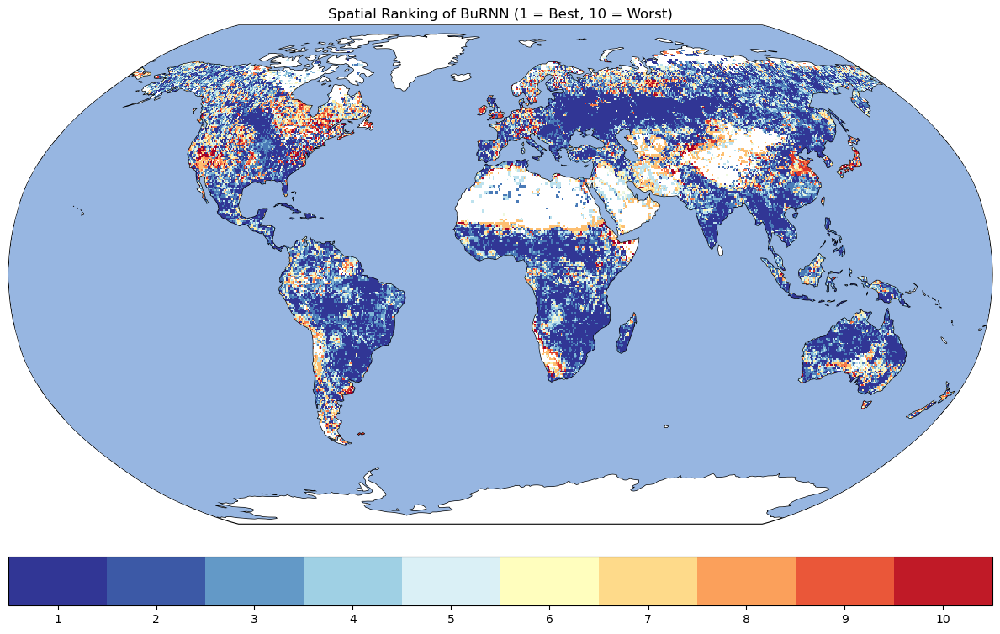

In [13]:
# Assume ds is your Dataset with 8 model performance variables
# and that the spatial dimensions are named "lat" and "lon"
models = list(corr_maps.data_vars.keys())

# Concatenate the model outputs into a single DataArray along a new "model" dimension
perf = xr.concat([corr_maps[m] for m in models], dim="model")
perf = perf.assign_coords(model=models)

# Fill NaNs with -infinity so that valid numbers always outrank NaNs
perf = perf.fillna(-np.inf)

# Ensure the "model" dimension is the first dimension.
# (Adjust "lat" and "lon" if your spatial dims have different names.)
perf = perf.transpose("model", "lat", "lon")

# Use NumPy's argsort to get the order that would sort the values in descending order.
# By sorting -perf.data along axis 0 (the "model" dimension), higher performance values come first.
desc_order = np.argsort(-perf.data, axis=0)  # shape: (num_models, lat, lon)

# Find the integer index corresponding to the "LSTM" model in our models list.
lstm_idx = models.index("BuRNN")

# For each (lat, lon), find the position (0-based) of lstm_idx in the sorted order.
# Adding 1 converts the rank to 1-based (1 = best, 8 = worst).
lstm_rank = (desc_order == lstm_idx).argmax(axis=0) + 1

# Convert the result back to an xarray DataArray for convenient plotting.
lstm_rank_da = xr.DataArray(
    lstm_rank,
    dims=["lat", "lon"],
    coords={"lat": perf.lat, "lon": perf.lon},
    name="BuRNN_Rank"
)

lstm_rank_da = lstm_rank_da.where(~mask_all_nan)

# Create a figure and an axes with the Robinson projection
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection=ccrs.Robinson())

# Plot the DataArray.
# We use transform=ccrs.PlateCarree() because the data is in lat/lon coordinates.
im = lstm_rank_da.plot(
    ax=ax,
    transform=ccrs.PlateCarree(),
    cmap="RdYlBu_r",
    add_colorbar=False  # We'll add a customized colorbar below.
)

# Add cartopy features: coastlines and ocean.
ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)

# Create a colorbar.
cbar = plt.colorbar(im, ax=ax, orientation='horizontal', pad=0.05, ticks=np.arange(0.5, len(models)+.5), boundaries = np.arange(0, len(models)+1))
cbar.ax.set_xticklabels(np.arange(1, len(models)+1))

plt.title(f"Spatial Ranking of BuRNN (1 = Best, {len(models)} = Worst)")
plt.tight_layout()
plt.savefig(os.path.join(logs_path, 'ranking.png'), dpi=400)
plt.show()

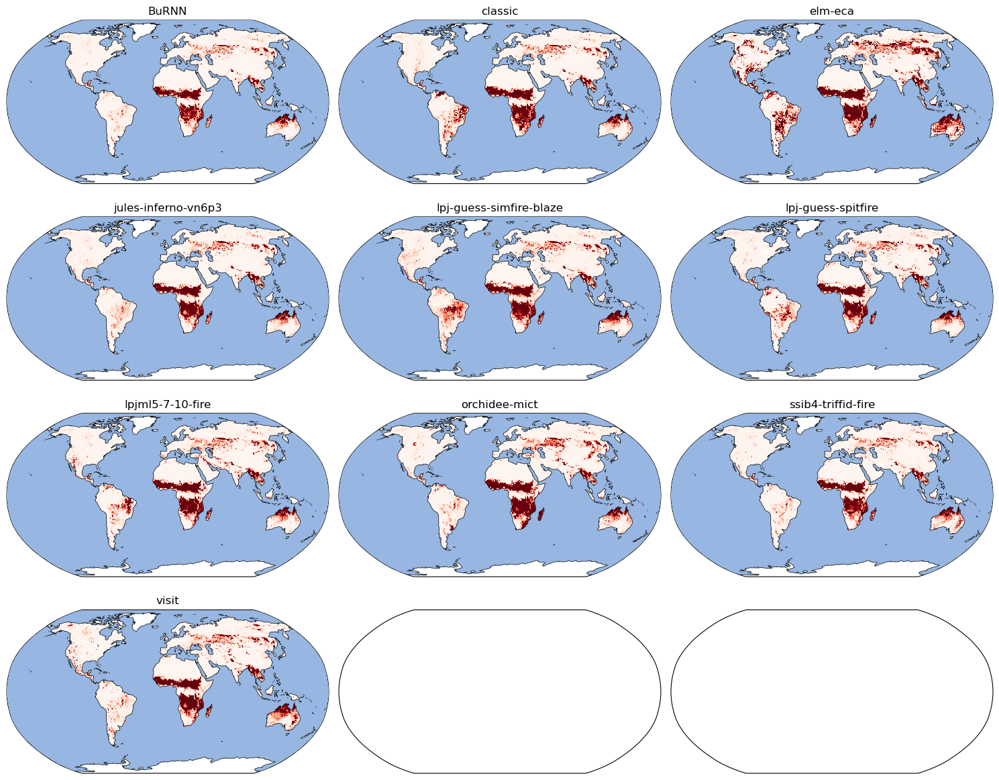

In [14]:
rmse_maps = xr.Dataset()
def get_pixel_rmse_map(cube1, cube2):
    da1 = xr.DataArray.from_iris(cube1)
    da2 = xr.DataArray.from_iris(cube2)
    rmse = (((da1 - da2)**2).mean(dim='time'))**1/2
    return rmse
rmse_maps['BuRNN'] = get_pixel_rmse_map(predicted_cube, obs_cube)

for model in model_cubelist:
    rmse_maps[model.long_name] = get_pixel_rmse_map(model, obs_cube)

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
number_of_plots = len(rmse_maps)
fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(15, 12), subplot_kw={'projection': ccrs.Robinson()})
axs = axs.ravel()
for idx, name in enumerate(rmse_maps):
    ax = axs[idx]
    da = rmse_maps[name]
    da.attrs['standard_name'] = None
    cube = da.to_iris()
    for coord in ('longitude', 'latitude'):
        cube.coords(coord)[0].guess_bounds()
    iplt.pcolormesh(cube, vmin=0, vmax=10, axes=ax, cmap="Reds")
    ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
    ax.add_feature(cartopy.feature.OCEAN, zorder=10)
    ax.set_title(name)
plt.tight_layout()
plt.savefig(os.path.join(figures_path, 'rmse_maps.png'), dpi=300)
warnings.simplefilter(action="default", category=iris.warnings.IrisVagueMetadataWarning)

/tmp/ipykernel_831141/2254002088.py:16: DeprecationWarning: Deleting a single level of a MultiIndex is deprecated. Previously, this deleted all levels of a MultiIndex. Please also drop the following variables: {'pixel'} to avoid an error in the future.
  corrs = corrs.drop_vars(['lat', 'lon', 'Region']).to_pandas()


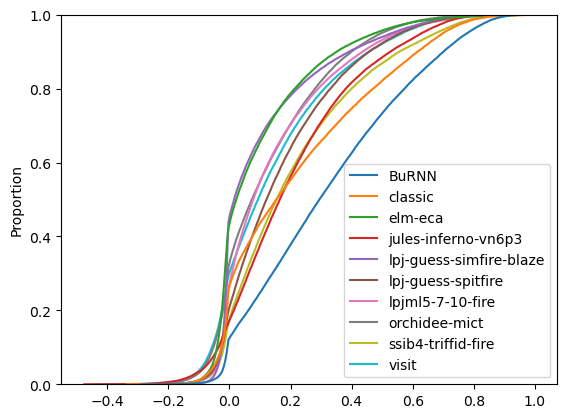

In [15]:
corrs = xr.Dataset()
fill = 'drop' #0
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
mask = ~np.isnan(xr.DataArray.from_iris(pixel_mean(obs_cube)).stack(pixel=['lat', 'lon']).values)
def get_pixel_corr(cube1, cube2, mask, fill=0):
    da1 = xr.DataArray.from_iris(cube1)
    da2 = xr.DataArray.from_iris(cube2)
    corr = xr.corr(da1, da2, dim='time')
    corr = corr.stack(pixel=['lat', 'lon'])[mask]
    if isinstance(fill, float) or isinstance(fill, int):
        return corr.fillna(fill)
    return corr
corrs['BuRNN'] = get_pixel_corr(predicted_cube, obs_cube, mask, fill=fill)
for model in model_cubelist:
    corrs[model.long_name] = get_pixel_corr(model, obs_cube, mask, fill=fill)
corrs = corrs.drop_vars(['lat', 'lon', 'Region']).to_pandas()
sns.ecdfplot(corrs)
plt.savefig(os.path.join(figures_path, 'global_corr_lineplot.png'), dpi=300)

In [24]:
corrs_time = xr.Dataset()
fill = 'drop' #0
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
mask = ~np.isnan(xr.DataArray.from_iris(pixel_mean(obs_cube)).stack(pixel=['lat', 'lon']).values)
def get_time_corr(cube1, cube2):
    da1 = xr.DataArray.from_iris(cube1)
    da2 = xr.DataArray.from_iris(cube2)
    corr = xr.corr(da1, da2, dim=['lat', 'lon'])
    return corr
corrs_time['BuRNN'] = get_time_corr(predicted_cube, obs_cube)
for model in model_cubelist:
    corrs_time[model.long_name] = get_time_corr(model, obs_cube)
corrs_time = corrs_time.to_pandas().drop(columns='year')

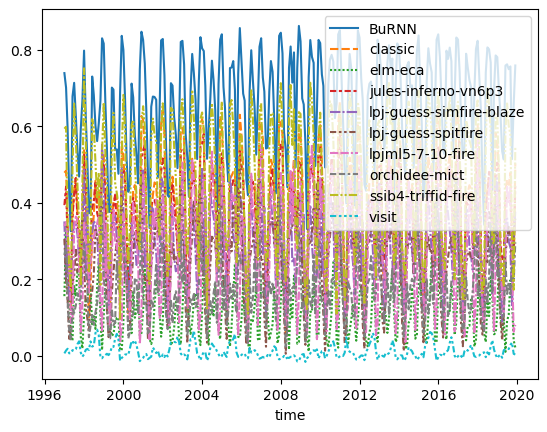

In [25]:
sns.lineplot(corrs_time)
plt.savefig(os.path.join(figures_path, 'monthly_corr_lineplot.png'), dpi=300)

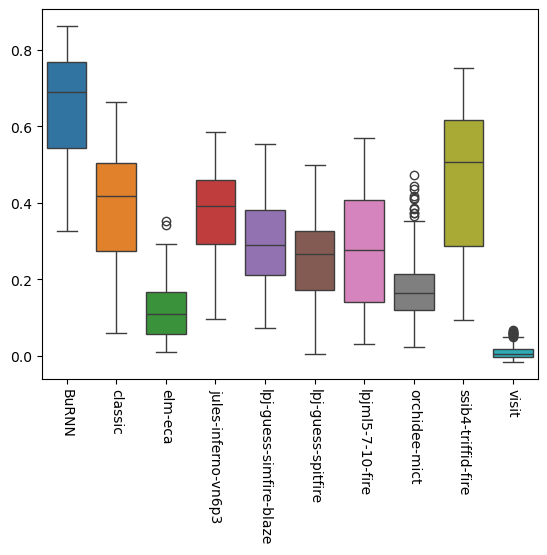

In [26]:
sns.boxplot(corrs_time)
plt.xticks(rotation=-90)
plt.savefig(os.path.join(figures_path, 'monthly_corr_boxplot.png'), dpi=300)
plt.show()

In [30]:
def calc_anomaly(da):
    return (da-da.mean(dim='time'))/da.std(dim='time')
obs_clim_anomaly = xr.DataArray.from_iris(obs_cube).groupby("time.month").apply(lambda da: calc_anomaly(da))
corrs_time_anomaly = xr.Dataset()
fill = 'drop' #0
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pred_clim_anomaly = xr.DataArray.from_iris(predicted_cube).groupby("time.month").apply(lambda da: calc_anomaly(da))
corrs_time_anomaly['BuRNN'] = xr.corr(obs_clim_anomaly, pred_clim_anomaly, dim=['lat', 'lon'])
for model in model_cubelist:
    model_clim_anomaly =  xr.DataArray.from_iris(model).groupby("time.month").apply(lambda da: calc_anomaly(da))
    corrs_time_anomaly[model.long_name] =  xr.corr(obs_clim_anomaly, model_clim_anomaly, dim=['lat', 'lon'])
corrs_time_anomaly = corrs_time_anomaly.to_pandas().drop(columns='year')

<Axes: xlabel='time'>

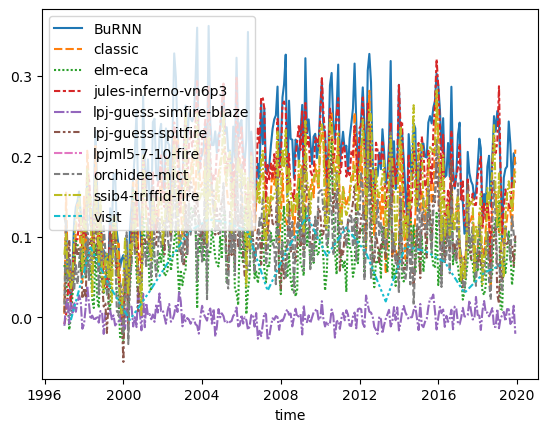

In [31]:
sns.lineplot(corrs_time_anomaly)

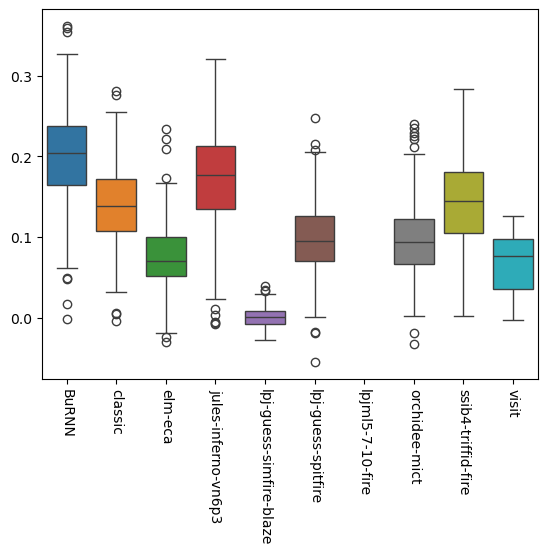

In [32]:
sns.boxplot(corrs_time_anomaly)
plt.xticks(rotation=-90)
plt.show()

# Other Stuff

#### SHAP

In [3]:
import shap

features = [
        #'primf', 'primn', 'secdf', 'secdn', 'urban', 'c3ann', 'c4ann', 'c3per', 'c4per', 'c3nfx', 'pastr', 'range', 'secmb', 'secma', #14
        'pastures', 'rangeland', #2
        'lightning', #1
        'rural-pop', 'urban-pop', #2
        'gdp', #1
        'tasmax', 'pr', 'sfcwind', #3
        'fwi', #1
        'spei01', 'spei03', 'spei06', #3
        'gpp', 'cveg', 'lai', #3
        #'Broadleaf evergreen tree', 'Needleleaf evergreen tree', 'grass', 'savanna', 'shrub', 'tundra shrub', 'Broadleaf deciduous tree'
        'urban', 'lake', 'crops', 'bare ground', 'needleleaf tree', 'evergreen tree', 'deciduous tree', 'shrub', 'boreal Shrub', 'C3 grass', 'C4 grass' #11
        , 'C4 grass Americas', 'C4 grass Africa', 'C4 grass Euraustralasia'
    ]

with open(os.path.join(logs_path, 'explanations.pickle'), 'rb') as handle:
    shap_dict = pickle.load(handle)

expl_dict = {}
values_dict = {region: [] for region in gfed_name_idx.keys() if region != 'OCEAN'}
data_dict = {region: [] for region in gfed_name_idx.keys() if region != 'OCEAN'}

for study_idx, shap_idx in shap_dict.items():
    for region_idx, (region, shap_idx_region) in enumerate(shap_idx.items()):
        for expl in shap_idx_region:
            values = np.stack(expl.values).mean(axis=0)
            data = expl.data
            values_dict[region].append(values)
            data_dict[region].append(data)

for region in values_dict.keys():
    region_data = np.concatenate(data_dict[region], axis=0)
    region_values = np.concatenate(values_dict[region], axis=0)   
    merged_explanation = shap.Explanation(
        values=region_values.mean(axis=1),
        data=region_data.mean(axis=1),
        feature_names=features
        )

    expl_dict[region] = merged_explanation

In [4]:
global_values = np.concatenate([expl.values for expl in list(expl_dict.values())])
global_data = np.concatenate([expl.data for expl in list(expl_dict.values())])
global_expl = shap.Explanation(values=global_values,
            data=global_data,
            feature_names=features)

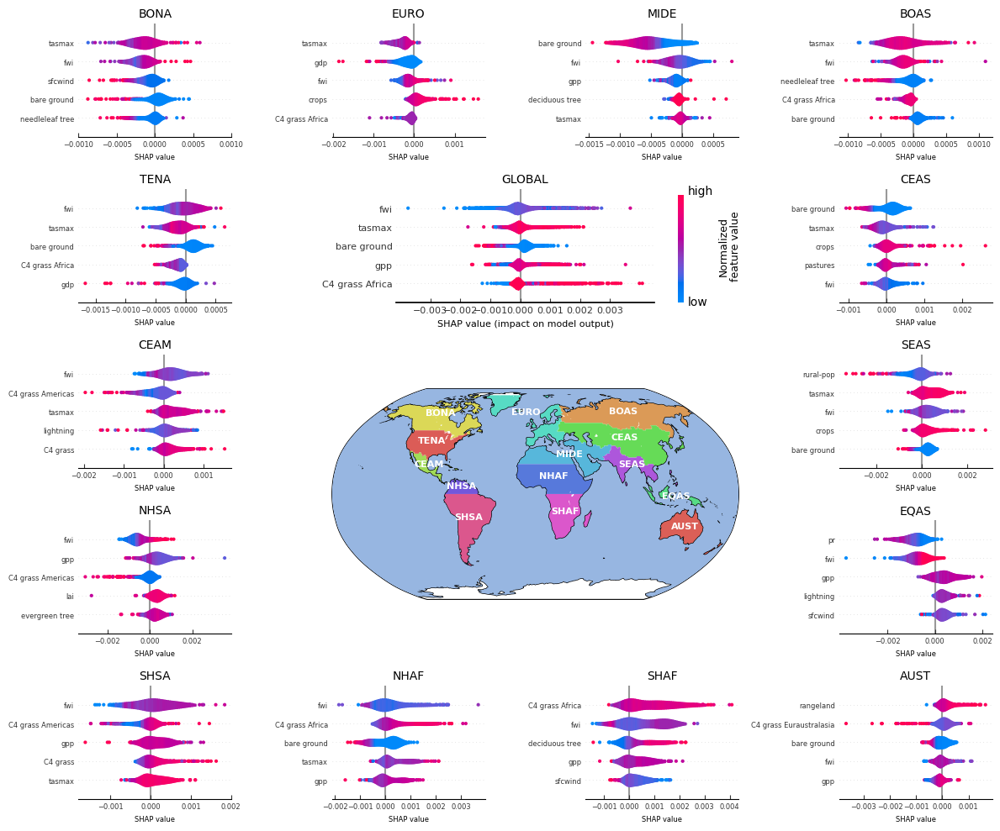

In [12]:
import matplotlib.gridspec as gridspec

fig = plt.figure(figsize=(12, 10))
gs = gridspec.GridSpec(5, 4, figure=fig)

gfed_plot_order = ['BONA', 'EURO', 'MIDE', 'BOAS', 'TENA', 'CEAS', 'CEAM', 'SEAS', 'NHSA', 'EQAS', 'SHSA', 'NHAF', 'SHAF', 'AUST']

outer_axes = []  # List to collect all outer axes
idx = 0
# Loop through grid cells
for i in range(5):
    for j in range(4):
        # Check if the cell is on the outer border
        if i in [0, 4] or j in [0, 3]:
            ax = fig.add_subplot(gs[i, j])
            regionname = gfed_plot_order[idx]
            ax.set_title(regionname, fontsize=10) 
            plt.sca(ax)
            #print(regionname)
            shap.plots.violin(expl_dict[regionname], show=False, max_display=5, plot_size=None, color_bar=False)
            if regionname == 'BONA':
                ax.set_xticks([-0.001, -0.0005, 0, 0.0005, 0.001])
            if regionname == 'EQAS':
                ax.set_xticks([-0.002, 0, 0.002])
            if regionname == 'SEAS':
                ax.set_xticks([-0.002, 0, 0.002])
            idx += 1
            ax.xaxis.label.set_size(6)
            ax.yaxis.label.set_size(6)
            ax.tick_params(labelsize=6, direction='in')
            ax.set_ymargin(5)
            ax.set_xlabel('SHAP value')

ax_global = fig.add_subplot(gs[1, 1:3])
ax_global.set_title('GLOBAL', fontsize=10, weight=1.2) 
ax_global.set_xticks([-0.003, -0.002, -0.001, 0, 0.001, 0.002, 0.003])

plt.sca(ax_global)
shap.plots.violin(global_expl, show=False, max_display=5, plot_size=None, color_bar=False)
ax_global.xaxis.label.set_size(8)
ax_global.yaxis.label.set_size(8)
ax_global.tick_params(labelsize=8, direction='in')

cbar = plt.colorbar(pad=-0.1)
cbar.set_ticks([-0.6, 2.4])
cbar.ax.tick_params(size=0)
cbar.ax.set_yticklabels(['low', 'high'])
cbar.outline.set_visible(False)
cbar.set_label('Normalized\nfeature value', fontsize=9)
cbar.ax.tick_params(labelsize=10)

#ax_global.set_position([global_pos.x0 + dis_change, global_pos.y0, global_pos.width-1.8*dis_change, global_pos.height], which='active')

# Combine the six middle cells into one central axis
ax_center = fig.add_subplot(gs[2:4, 1:3], projection=ccrs.Robinson())
ax_center.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax_center.add_feature(cartopy.feature.OCEAN, zorder=10)


gfed_keys = list(gfed_mask.keys())
gfed_combined = deepcopy(gfed_mask[gfed_keys[0]]).rename('GFED') * 0
for idx, regionname in enumerate(gfed_keys):
    gfed_combined.values += idx*(~gfed_mask[gfed_keys[idx]])
region_idcs = {idx: region for idx, region in enumerate(list(gfed_mask.keys()))}

geometries = []
labels = []
for geom, value in shapes(gfed_combined.values.astype(np.float32), transform=from_bounds(gfed_combined.lon.min(), gfed_combined.lat.min(), gfed_combined.lon.max(), gfed_combined.lat.max(), gfed_combined.lon.size, gfed_combined.lat.size)):
    geometries.append(shape(geom))  # Convert to Shapely geometry
    labels.append(int(value))       # Preserve the region label

# Create GeoDataFrame
gdf = gpd.GeoDataFrame({'region': [region_idcs[label] for label in labels], 'geometry': geometries}, crs="EPSG:4326")
gdf = gdf.dissolve(by='region').reset_index()
gdf = gdf.drop(10)

ax_center.set_extent([-180, 180, -90, 90])
ax_center = gdf.plot(ax=ax_center, transform=ccrs.PlateCarree(), legend=False, cmap=sns.color_palette('hls', 14, as_cmap=True))
gdf.apply(lambda x: ax_center.annotate(text=x.region, xy=x.geometry.centroid.coords[0], xycoords=ccrs.PlateCarree(), ha='center', fontsize=8, zorder=100, c='white', weight='bold'), axis=1)

for ax in outer_axes:
    ax.minorticks_off()

plt.tight_layout()

pos = ax_global.get_position()
new_width = pos.width / 1.5
new_x0 = pos.x0 + (pos.width - new_width) / 2
new_y0 = pos.y0
ax_global.set_position([new_x0, new_y0, new_width, pos.height])
for spine in ax_global.spines:
    ax_global.spines[spine].set_linewidth(1.25)
    
plt.savefig(os.path.join(logs_path, 'SHAP.png'), dpi=400)
plt.show()

In [136]:
T = 24
F = 27
N = shap_values_concat.shape[0] // T
shap_values_reshaped = shap_values_concat.reshape(N, T, T, F)
shap_values_diag = np.diagonal(shap_values_reshaped, axis1=1, axis2=2).transpose(0, 2, 1)

In [17]:
import shap
run_name = 'mse_1_64_reduced_set' #'default' #'imbalanced' #'2024-10-02_154002' #False
logs_path = os.path.join(model_path, 'Logs', run_name)
folds = [dirname[5:].split('_') for dirname in os.listdir(logs_path) if (os.path.isdir(os.path.join(logs_path, dirname)) and dirname != 'lightning_logs')]

n_batches = 2
shap_dict = {}

test_fold_paths = [os.path.join(logs_path, directory_name) for directory_name in os.listdir(logs_path) if directory_name.startswith('test_')]    
for test_fold_idx, test_fold_path in enumerate(test_fold_paths):
    test_name = os.path.basename(os.path.normpath(test_fold_path))
    test_regions = test_name.split('_')[1:]
    test_fold_path_studies = [os.path.join(test_fold_path, study_name) for study_name in os.listdir(test_fold_path)]
    test_fold_path_studies.sort(key=lambda x: os.path.getmtime(x))            
    print(f'Starting test {test_regions}')      
    shap_dict[test_name] = {}

    for study_idx, study_path in enumerate(test_fold_path_studies):
        study_name = study_path.split('/')[-1]
        val_regions = study_name.split('.')[0].split('_')[1:]
        for idx, item in enumerate(val_regions):
            if '-' in item:
                idx_item = val_regions[idx].split('-')
                val_regions = [val_regions[:idx] + [idx_item[0]], [idx_item[1]] + val_regions[idx+1:]]
        dm.change_val_test_folds(val_folds=val_regions, test_folds=[test_regions])
        for ds in dm.fold_datasets:
            ds.hparams.prediction_length = 0
        optuna_study = optuna.load_study(study_name=study_name, storage=f"sqlite:///{study_path}/optuna_study.db") # storage=f"sqlite:///{study_path}"
        version_number = optuna_study.best_trial.number #+ 5*study_idx + num_runs*5*test_fold_idx # Change here (remove + 5*study_idx + num_runs*5*test_fold_idx)
        selected_model = f'version_{version_number}'
        model_version = os.path.join(study_path, 'lightning_logs', selected_model) # Change logs_path to study_path
        version_list = [pathname for pathname in glob.glob(os.path.join(model_version, 'checkpoints', '*')) if pathname.split('/')[-1].startswith('epoch')]
        last_version = max(version_list, key=os.path.getctime)
        best_version = torch.load(last_version, map_location="cpu")['callbacks']["ModelCheckpoint{'monitor': 'val_loss', 'mode': 'min', 'every_n_train_steps': 0, 'every_n_epochs': 1, 'train_time_interval': None}"]['best_model_path'].split('/')[-1]
        best_version = [filename for filename in version_list if best_version in filename][0]
        model = LightningLSTM.load_from_checkpoint(best_version)#.to(device)
        model.eval()
        print(f'Starting val {val_regions}')

        some_training_samples = []
        train_loader = iter(dm.get_dataloader('train'))
        for n in range(n_batches):
            some_training_samples.append(next(train_loader)[0])
        some_training_samples = torch.concat(some_training_samples)[:, 120:180, :]#.to(device)
        explainer = shap.GradientExplainer(model, some_training_samples)

        some_test_samples = []
        test_loader = iter(dm.get_dataloader('test'))
        for n in range(n_batches):
            some_test_samples.append(next(test_loader)[0])
        some_test_samples = torch.concat(some_test_samples)[:, 120:180, :]#.to(device)

        '''
        shap_values = []
        for i in tqdm(range(some_test_samples.shape[0]), desc="Computing SHAP values"):
            # Compute SHAP values for one sample at a time
            sample_shap = explainer.shap_values(some_test_samples[i:i+1])
            shap_values.append(sample_shap)
            
        # Optionally, combine the results
        shap_values = np.concatenate(shap_values, axis=0)
        shap_dict[test_name][study_name] = (explainer, shap_values, some_test_samples)
        '''
        explanation = explainer(some_test_samples)
        shap_dict[test_name][study_name] = explanation
    break

Starting test ['EEU', 'NWN', 'MED', 'SAU']


[rank: 0] Seed set to 2465321163


Starting val [['WNA', 'ESAF', 'ENA', 'WCA'], ['SCA', 'CNA', 'CAU', 'SWS']]


dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1


KeyboardInterrupt: 

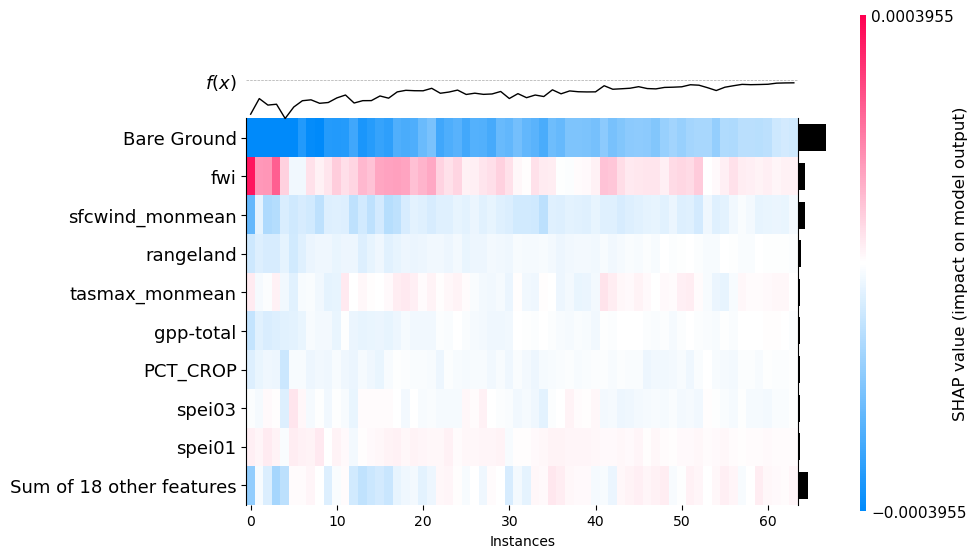

In [231]:
calibration_steps = 36  # First 36 timesteps are calibration
num_pred_timesteps = 60  # Last 24 timesteps are predicted
explanation = shap_dict[test_name]['val_WNA_ESAF_ENA_WCA-SCA_CNA_CAU_SWS']
feature_names = features
# Extract the number of timesteps (24), samples (64), and features (27)
num_timesteps = len(explanation)  # Should be 24
num_samples = explanation[0].values.shape[0]  # Should be 64
num_features = explanation[0].values.shape[2]  # Should be 27

# Arrays to store SHAP values and feature data
shap_values_array = np.zeros((num_samples, num_timesteps, num_features))
features_array = np.zeros((num_samples, num_timesteps, num_features))

for t, exp in enumerate(explanation):  
    # Extract SHAP values and feature values for the current timestep
    shap_values_array[:, t, :] = exp.values[:, t, :]
    
    if exp.data.shape == (num_samples, 60, num_features):  
        features_array[:, t, :] = exp.data[:, t, :]
    elif exp.data.shape == (60, num_features):  
        features_array[:, t, :] = np.tile(exp.data[t, :], (num_samples, 1))

# Stack over timesteps to get (64*24, 27)
#shap_values_combined = np.stack(shap_values_list)  
#features_combined = np.stack(features_list)  

# Compute the mean over timesteps -> shape (num_samples, num_features)
shap_values_mean = np.mean(shap_values_array, axis=1)
features_mean = np.mean(features_array, axis=1)

# Create a single Explanation object
merged_explanation = shap.Explanation(
    values=shap_values_mean,
    data=features_mean,
    feature_names=feature_names
)

# Plot the SHAP violin plot
shap.plots.heatmap(
    merged_explanation
)


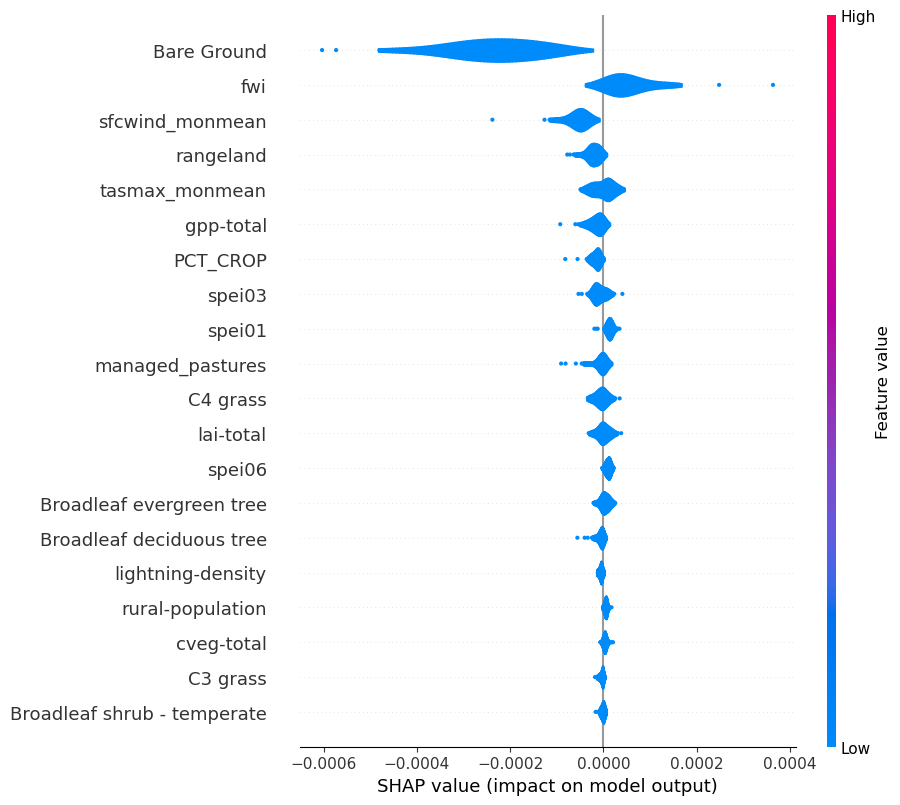

In [234]:
shap.plots.violin(merged_explanation)

In [ ]:
# Assume X_test is your test set with shape (n_samples, n_timesteps, n_features)
shap_values = []
for i in tqdm(range(100), desc="Computing SHAP values"):
    # Compute SHAP values for one sample at a time
    sample_shap = explainer.shap_values(some_test_samples[i:i+1])
    shap_values.append(sample_shap)
    
# Optionally, combine the results
shap_values = np.concatenate(shap_values, axis=0)

In [35]:
shap_values = np.concatenate(shap_values, axis=0)

In [36]:
shap_values_aggregated = np.mean(shap_values.squeeze(), axis=1)

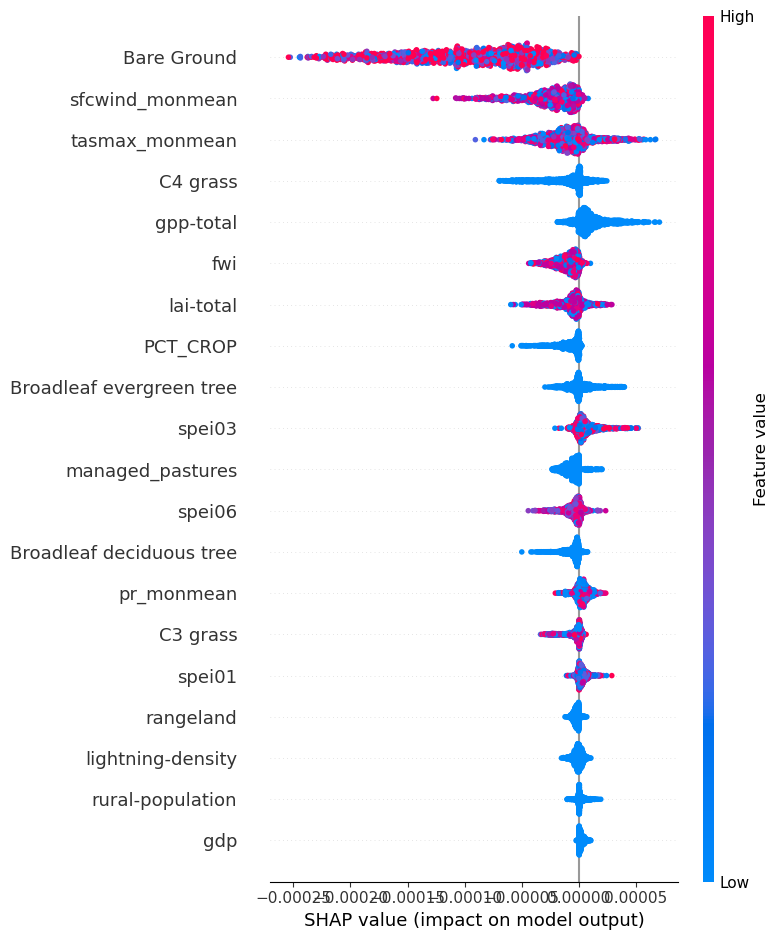

In [109]:
shap.summary_plot(shap_values_aggregated, 
                  some_test_samples[:shap_values.shape[0], 0, :],
                  feature_names=features)

### General Plots

#### Examples (monthly)

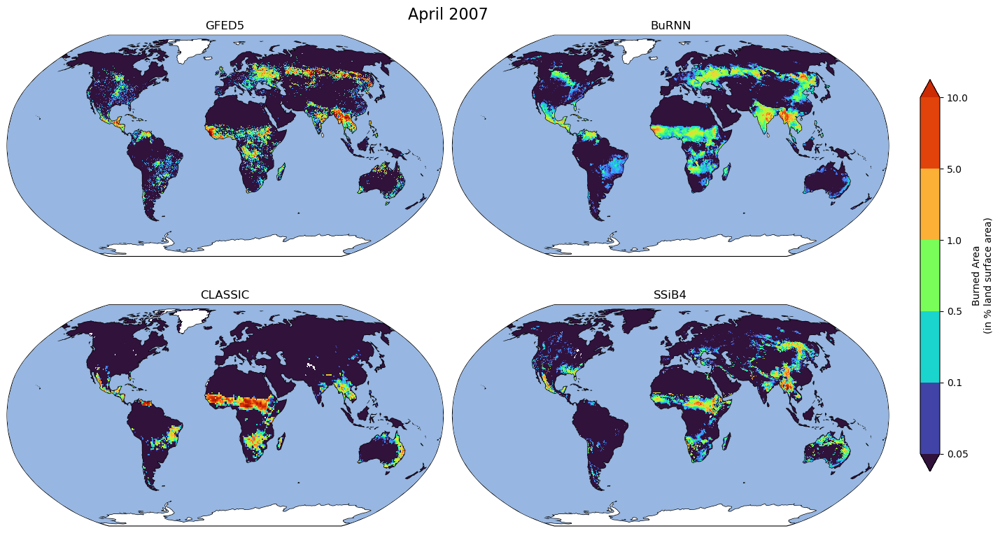

In [87]:
import calendar
month_dict = {idx: month for idx, month in enumerate(list(calendar.month_name))}

year = 2007
month = 4
idx = (year - 1997)*12 + month-1

cmap = plt.get_cmap('turbo').copy()
# Get the darkest color in turbo
darkest_turbo_color = cmap(0.0)  # 0.0 = bottom of the colormap
# Set it as the 'under' color
cmap.set_under(darkest_turbo_color)
boundaries = np.array([0.05, 0.1, 0.5, 1, 5, 10])  # Discrete steps
# for some reason the cmap doesn't like it when you use lognorm norm and when vmin is below 1.
# So we multiply our results by a large factor, and divide our cbar so it shows the original values.
cmap_corr_f = 1000
norm = mcolors.LogNorm(vmin=0.05*cmap_corr_f, vmax=20*cmap_corr_f)


fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 8), subplot_kw={'projection': ccrs.Robinson()})
axs = axs.ravel()

ax = axs[0]
mesh = iplt.pcolormesh((obs_cube[idx]+0.0001)*cmap_corr_f, norm=norm, cmap=cmap, axes=ax)
ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)
ax.set_title('GFED5')

ax = axs[1]
iplt.pcolormesh((predicted_cube[idx]+0.0001)*cmap_corr_f, norm=norm, cmap=cmap, axes=ax)
ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)
ax.set_title('BuRNN')

ax = axs[2]
iplt.pcolormesh((model_cubelist[0][idx]+0.0001)*cmap_corr_f, norm=norm, cmap=cmap, axes=ax)
ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)
_ = ax.set_title('CLASSIC')

ax = axs[3]
iplt.pcolormesh((model_cubelist[7][idx]+0.0001)*cmap_corr_f, norm=norm, cmap=cmap, axes=ax)
ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)
_ = ax.set_title('SSiB4')

plt.tight_layout(h_pad=0.5)
# 1) Reserve room on the right (tweak the 0.85 until nothing overlaps)
fig.subplots_adjust(right=0.85)

# 2) Manually add a slim axes for the colorbar at [left, bottom, width, height]
#    all in figure‐fraction coordinates
cbar_ax = fig.add_axes([0.88, 0.15, 0.02, 0.7])
cbar_ax.set_frame_on(False)
cbar_ax.set_yticks([])
cbar_ax.set_xticks([])
# 3) Draw the colorbar into that axes
cbar = fig.colorbar(mesh, ax=cbar_ax, fraction=1, pad=0.04, orientation='vertical', label='Burned Area\n(in % land surface area)', boundaries=boundaries*cmap_corr_f, ticks=boundaries*cmap_corr_f, extend='both')

# (optional) if you want the original data-scale legend, divide ticks back:
cbar.set_ticks(boundaries * cmap_corr_f)
cbar.set_ticklabels(boundaries)

fig.suptitle(f'{month_dict[month]} {year}', fontsize=16, x=0.43)
plt.savefig(os.path.join(logs_path, 'example_1.png'), dpi=400, bbox_inches='tight', pad_inches=0.1)

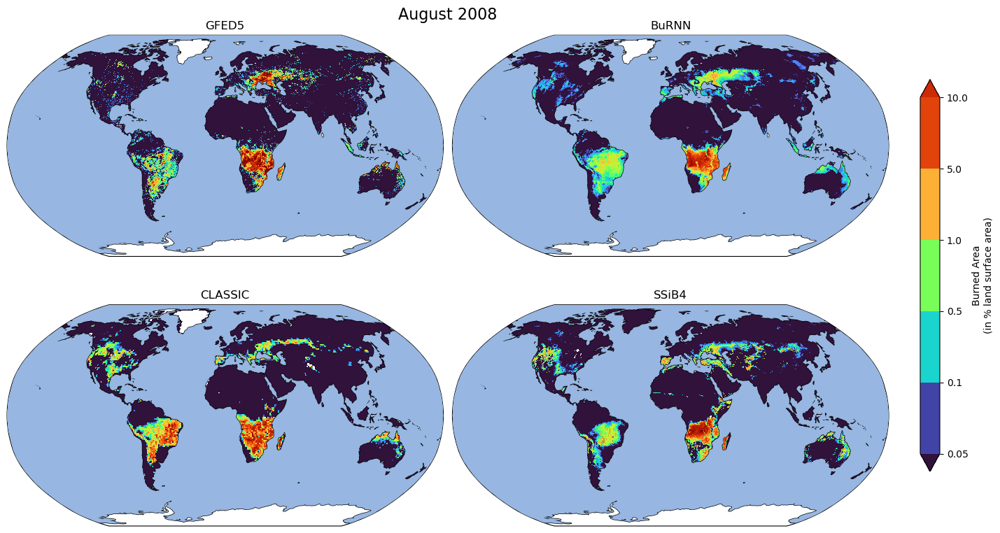

In [88]:
year = 2008
month = 8
idx = (year - 1997)*12 + month-1

cmap = plt.get_cmap('turbo').copy()
# Get the darkest color in turbo
darkest_turbo_color = cmap(0.0)  # 0.0 = bottom of the colormap
# Set it as the 'under' color
cmap.set_under(darkest_turbo_color)
boundaries = np.array([0.05, 0.1, 0.5, 1, 5, 10])  # Discrete steps
# for some reason the cmap doesn't like it when you use lognorm norm and when vmin is below 1.
# So we multiply our results by a large factor, and divide our cbar so it shows the original values.
cmap_corr_f = 1000
norm = mcolors.LogNorm(vmin=0.05*cmap_corr_f, vmax=20*cmap_corr_f)


fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 8), subplot_kw={'projection': ccrs.Robinson()})
axs = axs.ravel()

ax = axs[0]
mesh = iplt.pcolormesh((obs_cube[idx]+0.0001)*cmap_corr_f, norm=norm, cmap=cmap, axes=ax)
ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)
ax.set_title('GFED5')

ax = axs[1]
iplt.pcolormesh((predicted_cube[idx]+0.0001)*cmap_corr_f, norm=norm, cmap=cmap, axes=ax)
ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)
ax.set_title('BuRNN')

ax = axs[2]
iplt.pcolormesh((model_cubelist[0][idx]+0.0001)*cmap_corr_f, norm=norm, cmap=cmap, axes=ax)
ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)
_ = ax.set_title('CLASSIC')

ax = axs[3]
iplt.pcolormesh((model_cubelist[7][idx]+0.0001)*cmap_corr_f, norm=norm, cmap=cmap, axes=ax)
ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)
_ = ax.set_title('SSiB4')

plt.tight_layout(h_pad=0.5)
# 1) Reserve room on the right (tweak the 0.85 until nothing overlaps)
fig.subplots_adjust(right=0.85)

# 2) Manually add a slim axes for the colorbar at [left, bottom, width, height]
#    all in figure‐fraction coordinates
cbar_ax = fig.add_axes([0.88, 0.15, 0.02, 0.7])
cbar_ax.set_frame_on(False)
cbar_ax.set_yticks([])
cbar_ax.set_xticks([])
# 3) Draw the colorbar into that axes
cbar = fig.colorbar(mesh, ax=cbar_ax, fraction=1, pad=0.04, orientation='vertical', label='Burned Area\n(in % land surface area)', boundaries=boundaries*cmap_corr_f, ticks=boundaries*cmap_corr_f, extend='both')

# (optional) if you want the original data-scale legend, divide ticks back:
cbar.set_ticks(boundaries * cmap_corr_f)
cbar.set_ticklabels(boundaries)

fig.suptitle(f'{month_dict[month]} {year}', fontsize=16, x=0.43)
plt.savefig(os.path.join(logs_path, 'example_2.png'), dpi=400, bbox_inches='tight', pad_inches=0.1)

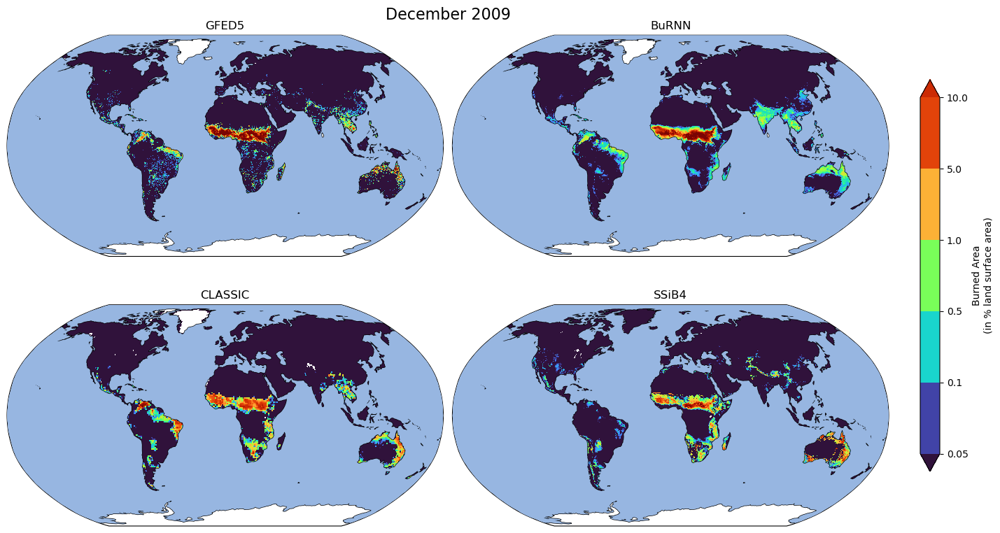

In [89]:
year = 2009
month = 12
idx = (year - 1997)*12 + month-1

cmap = plt.get_cmap('turbo').copy()
# Get the darkest color in turbo
darkest_turbo_color = cmap(0.0)  # 0.0 = bottom of the colormap
# Set it as the 'under' color
cmap.set_under(darkest_turbo_color)
boundaries = np.array([0.05, 0.1, 0.5, 1, 5, 10])  # Discrete steps
# for some reason the cmap doesn't like it when you use lognorm norm and when vmin is below 1.
# So we multiply our results by a large factor, and divide our cbar so it shows the original values.
cmap_corr_f = 1000
norm = mcolors.LogNorm(vmin=0.05*cmap_corr_f, vmax=20*cmap_corr_f)


fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 8), subplot_kw={'projection': ccrs.Robinson()})
axs = axs.ravel()

ax = axs[0]
mesh = iplt.pcolormesh((obs_cube[idx]+0.0001)*cmap_corr_f, norm=norm, cmap=cmap, axes=ax)
ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)
ax.set_title('GFED5')

ax = axs[1]
iplt.pcolormesh((predicted_cube[idx]+0.0001)*cmap_corr_f, norm=norm, cmap=cmap, axes=ax)
ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)
ax.set_title('BuRNN')

ax = axs[2]
iplt.pcolormesh((model_cubelist[0][idx]+0.0001)*cmap_corr_f, norm=norm, cmap=cmap, axes=ax)
ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)
_ = ax.set_title('CLASSIC')

ax = axs[3]
iplt.pcolormesh((model_cubelist[7][idx]+0.0001)*cmap_corr_f, norm=norm, cmap=cmap, axes=ax)
ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)
_ = ax.set_title('SSiB4')

plt.tight_layout(h_pad=0.5)
# 1) Reserve room on the right (tweak the 0.85 until nothing overlaps)
fig.subplots_adjust(right=0.85)

# 2) Manually add a slim axes for the colorbar at [left, bottom, width, height]
#    all in figure‐fraction coordinates
cbar_ax = fig.add_axes([0.88, 0.15, 0.02, 0.7])
cbar_ax.set_frame_on(False)
cbar_ax.set_yticks([])
cbar_ax.set_xticks([])
# 3) Draw the colorbar into that axes
cbar = fig.colorbar(mesh, ax=cbar_ax, fraction=1, pad=0.04, orientation='vertical', label='Burned Area\n(in % land surface area)', boundaries=boundaries*cmap_corr_f, ticks=boundaries*cmap_corr_f, extend='both')

# (optional) if you want the original data-scale legend, divide ticks back:
cbar.set_ticks(boundaries * cmap_corr_f)
cbar.set_ticklabels(boundaries)

fig.suptitle(f'{month_dict[month]} {year}', fontsize=16, x=0.43)
plt.savefig(os.path.join(logs_path, 'example_3.png'), dpi=400, bbox_inches='tight', pad_inches=0.1)